# Direct marketing optimisation  
In this notebook, we will create the analytical dataset.

We first clean the data by handling missing values, perform EDA, try to pick out relevant features (based on research  
and consulting sales people with regards to consumer behaviour), and creating new features if necessary.

The general strategy is to calculate the expected revenue, by training 2 models for each product; a classifier and a  
regressor. The classifier provides the probability of sale, and the regressor provides the estimated revenue.  
In our method, we train the regressor by ignoring all the negative class.

The actual details and decisions will be discussed in the section(s).

**Table of contents**
1. [Imports](#Imports)
1. [Load Data](#Load-Data)
1. [Perform train-test split](#Perform-train-test-split)
1. [Data preprocessing](#Data-preprocessing)
    1. [Handling missing values](#Handling-missing-values)
    1. [Sanity checks](#Sanity-checks)
    1. [Reducing feature categories](#Reducing-feature-categories)
    1. [Saving the preprocessing datasets](#Saving-the-preprocessing-datasets)
1. [EDA](#EDA)
    1. [Splitting the dataset into 3](#Splitting-the-dataset-into-3)
    1. [Mass EDA](#Mass-EDA)
    1. [EDA Analysis](#EDA-Analysis)
        1. [Credit Card](#Credit-Card)
        1. [Consumer Loan](#Consumer-Loan)
        1. [Mutual Fund](#Mutual-Fund)
    1. [Generating the datasets](#Generating-the-datasets)

## Imports 
[Back to Top](#Direct-marketing-optimisation)

In [1]:
import os

os.chdir("..")
os.path.abspath(".")

'/Users/samuelkoh/projects/singlife_technical'

In [2]:
from sklearn.model_selection import train_test_split
from loguru import logger

from src.eda import eda
from src.features import (
    categorical_features,
    dem_features,
    io_features,
    new_categorical_features,
    new_continuous_features,
    prod_bal_features,
    revenue_cc_features,
    revenue_cl_features,
    revenue_mf_features,
    revenue_target,
    sale_cc_features,
    sale_cl_features,
    sale_mf_features,
    sale_target,
    suffixes,
)
from src.file_path import (
    cleaned_data_directory,
    preprocessed_data_directory,
    raw_data_directory,
)
from src.preprocessing import preprocess_data
from src.read_data import ingest_and_merge_data

random_seed = 42

## Load Data 
[Back to Top](#Direct-marketing-optimisation)

In [3]:
raw_excel_file_path = raw_data_directory + "DataScientist_CaseStudy_Dataset.xlsx"
data_dict, df = ingest_and_merge_data(raw_excel_file_path)

## Perform train-test split
We already have 40% of the target variable(s) data missing, we will use that as the test set.  

[Back to Top](#Direct-marketing-optimisation)

In [4]:
features_columns = dem_features + prod_bal_features + io_features
target_columns = sale_target + revenue_target

In [5]:
test_set_mask = df[target_columns].isna().all(axis=1)

train_set = df[~test_set_mask.to_numpy()].drop(columns="Client")
test_set = df[test_set_mask][["Client"] + features_columns]

In [6]:
raw_csv_test_path = raw_data_directory + "test.csv"
test_set.to_csv(raw_csv_test_path, index=False)

**Note: Henceforth, we shall call the evaluation set a test set as well.**  
Not to be confused with the test set (40%) that we split above.

## Data preprocessing
In this section, we perform data preprocessing, including feature engineer steps that does not require train-test split.  
Transformations that will cause data leakage will be discussed after we perform train test split.  

[Back to Top](#Direct-marketing-optimisation)

### Handling missing values
For each category of missing values we do the following:
1. Soc_Dem: 
    - Random imputation based on the proportion of M and F.
    - Encoding `M` -> 1, `F -> 0`
1. Products_ActBalance:
    - Assume non-participation and impute all values with -1 for simplicity.
    - -1 is chosen to make a distinction between having 0 balance and not possibly having any balance.
1. Inflow_Outflow:
    - Assume inactivity and impute all missing values with 0.
    - Note that for each client, if one of the feature is a missing value, then all the features are missing too. This  
        works out to about 18 clients who having missing values in the Inflow_Outflow sheet. Tempting it might be to  
        just drop these values, it turns out that these 18 clients are non-trivial.

[Back to Top](#Direct-marketing-optimisation)

In [7]:
train_set.info()

<class 'pandas.core.frame.DataFrame'>
Index: 969 entries, 0 to 1614
Data columns (total 35 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Sex                           967 non-null    object 
 1   Age                           969 non-null    int64  
 2   Tenure                        969 non-null    int64  
 3   Count_CA                      969 non-null    int64  
 4   Count_SA                      265 non-null    float64
 5   Count_MF                      184 non-null    float64
 6   Count_OVD                     251 non-null    float64
 7   Count_CC                      110 non-null    float64
 8   Count_CL                      79 non-null     float64
 9   ActBal_CA                     969 non-null    float64
 10  ActBal_SA                     265 non-null    float64
 11  ActBal_MF                     184 non-null    float64
 12  ActBal_OVD                    251 non-null    float64
 13  ActBal_CC

### Sanity checks
We start with checking if the values make sense.

Many times, `Age` is a good way of removing noise from the dataset. For instance, our use case requires us to sell  
products to potential clients. However, we may not sell to kids. We assume the legal age required is `18`.

Consider the case where `Age <= Tenure`. The only way for this to happen is when the current client was passed this  
account (surviving, joint-ownership, etc) from the previous client. In such cases, we assume the worse, that they were  
inherited, and that any existing products was bought by the previous client. We therefore exclude these cases as well.

[Back to Top](#Direct-marketing-optimisation)

In [8]:
# Number of underaged accounts
len(train_set[train_set["Age"] < 18])

60

In [9]:
# A 6 year old kid generating 46 Euros in revenue while the mean is ~3.6 Euros.. Bruce Wayne?
train_set.loc[[1168]]

,Sex,Age,Tenure,Count_CA,Count_SA,Count_MF,Count_OVD,Count_CC,Count_CL,ActBal_CA,...,TransactionsDeb_CA,TransactionsDebCash_Card,TransactionsDebCashless_Card,TransactionsDeb_PaymentOrder,Sale_MF,Sale_CC,Sale_CL,Revenue_MF,Revenue_CC,Revenue_CL
1168,F,6,172,1,NaN,NaN,NaN,NaN,NaN,1824.04,...,9.0,1.0,7.0,0.0,1.0,1.0,1.0,2.461964,5.170357,46.392857


In [10]:
# Number of inherited accounts
len(train_set[train_set["Age"] * 12 <= train_set["Tenure"]])

34

### Reducing feature categories
Categorical features with high cardinality can pose challenges such as overfitting, computational inefficiency, and  
reduced interpretability. To address this, we reduce the dimensionality of such features while preserving their  
predictive power.

The next cell shows that `Count_MF` has high dimension. We generate a rule via chatgpt:
1. Beginner Investor (1): Owns 1-3 mutual funds.
    - Typically new to investing and exploring basic diversification.
2. Intermediate Investor (2): Owns 4-10 mutual funds.
    - Has a more balanced portfolio and demonstrates an understanding of diversification and investment strategies.
3. Advanced Investor (3): Owns 11 or more mutual funds.
    - Likely very experienced, with a highly diversified portfolio spanning various sectors or geographies.

[Back to Top](#Direct-marketing-optimisation)

In [11]:
# Calculate number of unique categories there are for each feature
for feature in categorical_features:
    print(f"{feature}: {len(train_set[feature].unique())}")

Sex: 3
Count_CA: 4
Count_SA: 4
Count_MF: 26
Count_OVD: 2
Count_CC: 2
Count_CL: 3


### Feature creation
Before we finally proceed to the next part, EDA, we first create some features that do not rely on insights from EDA  
but rather, from financial formulas that can be easily found on the internet, or just aggregating similar features.

We will create the following features:
1. `Count_Total_Asset` the total number of accounts related to assets they have.
1. `Count_Total_Liability`the total number of accounts related to liabilities they have.
1. `ActBal_Total` = `ActBal_Total_Asset` - `ActBal_Total_Liability`
    - If this value is less than 0 (even in the test set), we might drop them, depending on their other features like  
    `VolumeDeb` and `VolumeCred`. This is because, if they are that poor, and their inflow - outflow is too low, then  
    they might not be able to repay their debts, and definitely will not be able to buy mutual funds.
1. `Debt_To_Balance` = `ActBal_Total_Liability` / `ActBal_Total`
    - If this value is negative, then **ActBal_Total < 0**, and if **ActBal_Total_Liability -> inf**, then  
    **Debt_To_Balance = -1**. That is, when **Debt_To_Balance < 0**, we can infer that **ActBal_Total < 0**, and that  
    **-1 is the worse score**, and get better as the score becomes more negative. Read -1 as being extremely in debt.
    - On the other hand, **ActBal_Total_Liability -> -inf** is the same as **ActBal_Total_Asset -> inf**, and  
    **Debt_To_Balance = 0**. That is, when **Debt_To_Balance >= 0**, we can infer that **ActBal_Total > 0**, and that  
    **0 is the best score**, and gets worse as the score becomes more positive. Clearly, 0 means having no debt, and a  
    number close to 0 means having extremely little debt.
    - Reference: https://www.wolframalpha.com/input?i=x+%2F+%28y-x%29
1. `Inflow_Outflow_Ratio` = `VolumeCred` / (`VolumeDeb` + 1e-6)
    - Higher implies more disposable income.

[Back to Top](#Direct-marketing-optimisation)

### Saving the preprocessed datasets
We checkpoint our progress at this stage.

[Back to Top](#Direct-marketing-optimisation)

In [12]:
df = preprocess_data(train_set)
df_test = preprocess_data(test_set)

full_cleaned_data_list = [("train", df), ("test", df_test)]

for split, data in full_cleaned_data_list:
    path = cleaned_data_directory + f"full_{split}.csv"
    data.to_csv(path, index=False)

## EDA

We perform EDA here to get a feel for the data.

We also perform a train test split again, as our "test" data does not contain any actual targets. This is so that we  
can simulate unseen data, while still being able to evaluate our final model's performance.

EDA for `Revenue_*` will be done by only considering the positive class. Details will be provided later.

[Back to Top](#Direct-marketing-optimisation)

### Splitting the dataset into 3
We intend produce models based on the type of product we are trying to sell.  
Hence, we will create 3 datasets, each with the same features (for now) and pairs of the target variable(s) (`Sale_*`, `Revenue_*`).

[Back to Top](#Direct-marketing-optimisation)

In [13]:
dfs = {
    suffix: df[
        features_columns
        + new_categorical_features
        + new_continuous_features
        + [f"Sale_{suffix}", f"Revenue_{suffix}"]
    ]
    for suffix in suffixes
}

### Mass EDA

We use the functions defined earlier and a for loop to plot the typical graphs for exploratory data analysis (EDA).  
Below, we briefly outline our observations for each product and determine which features to use in subsequent analysis. 

In the case when the box plots are hard to visualise (recall for the `Product_ActBalance` sheet there were many missing  
values, and some of them contain huge outliers), we filter the values which we denoted as -1 in the preprocessing step.  
Do note however that this is not proper, as we are ignoring cases of non-participation. It does however give us some  
"estimate" of whether or not the feature is helpful.

The following visualisations will be produced:

1. Target Variable Analysis
    - Distribution of the sale target (binary target)
    - Distribution of the revenue target (continuous target, for successful sales)

1. Feature Distribution Analysis
    - For each continuous feature:
        - Distribution plot
        - Boxplot by sale target
        - Filtered boxplot by sale target (if feature is in exclude list)
    - For each categorical feature:
        - Bar plot by sale target
        - Filtered bar plot by sale target (if feature is in exclude list)

1. Correlation Analysis
    - Continuous features vs sale target (point-biserial correlation)
    - Categorical features vs sale target (Cramér's V)
    - Continuous features vs revenue target (Spearman correlation)
    - Categorical features vs revenue target (Cramér's V)
    - Correlation matrix for continuous features

[Back to Top](#Direct-marketing-optimisation)

2025-01-01 12:24:53.057 | INFO     | src.eda:eda:34 - Performing EDA for Sale
2025-01-01 12:24:53.057 | INFO     | src.eda:eda_sales:210 - EDA for Sale Target
2025-01-01 12:24:53.058 | INFO     | src.eda:print_table:70 - 
+------------+-------------------------------------------+
| Sale Value |                 Percentage                |
+------------+-------------------------------------------+
| [0.0, 1.0] | [0.7448275862068966, 0.25517241379310346] |
+------------+-------------------------------------------+


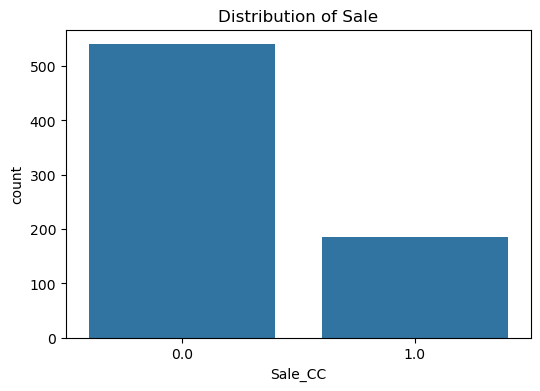

2025-01-01 12:24:53.113 | INFO     | src.eda:eda:36 - Performing EDA for Sale-related Features
2025-01-01 12:24:53.113 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): Age


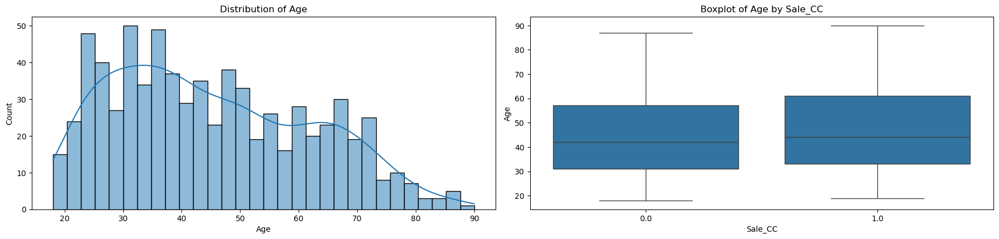

2025-01-01 12:24:53.235 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): Tenure


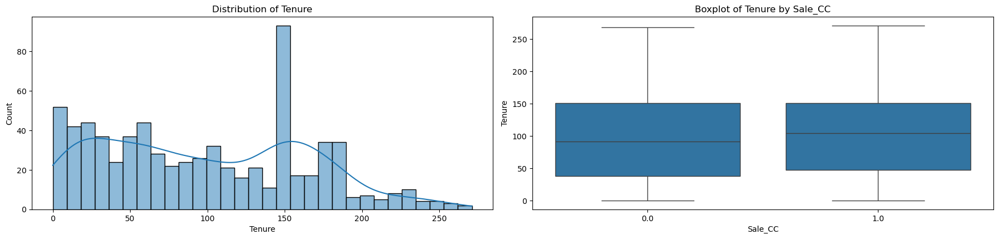

2025-01-01 12:24:53.351 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_CA


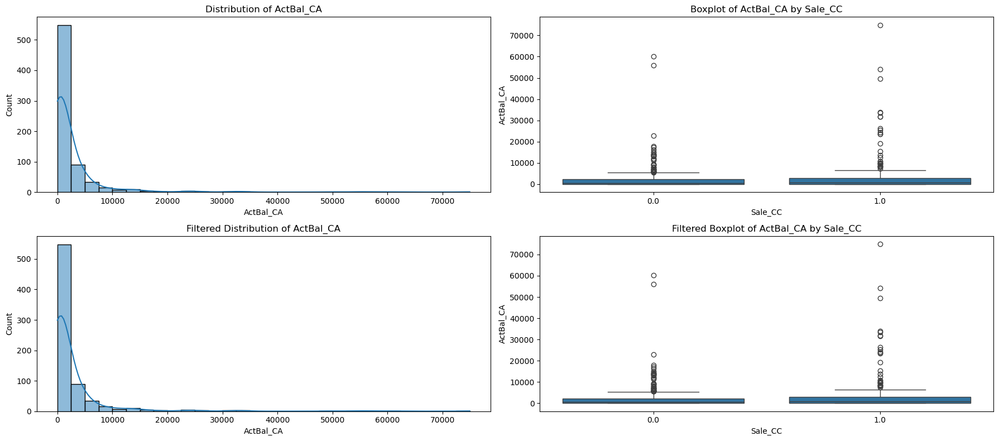

2025-01-01 12:24:53.691 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_SA


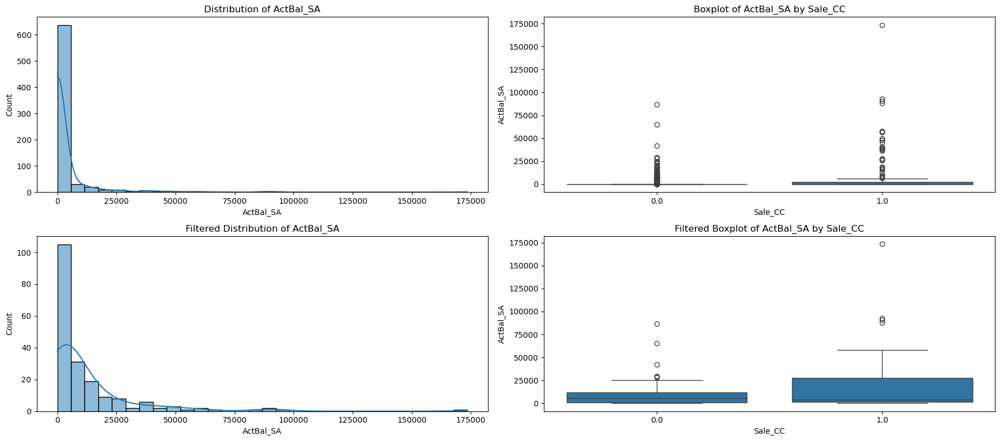

2025-01-01 12:24:53.919 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_MF


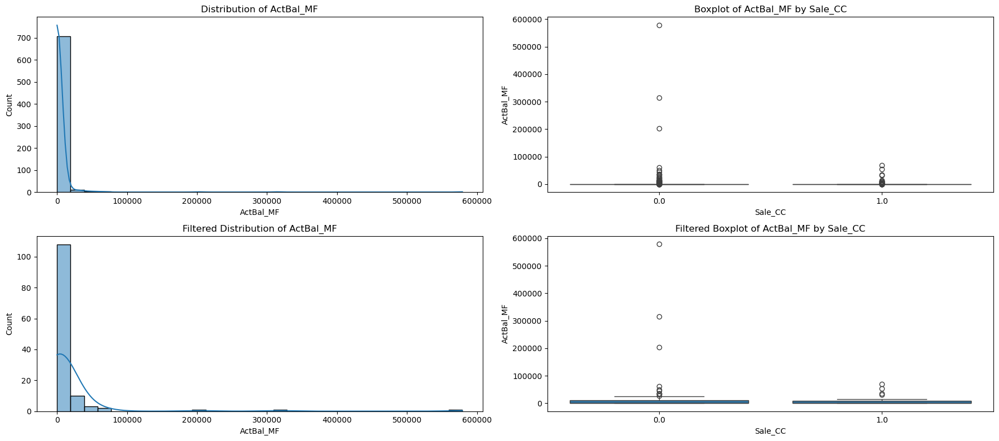

2025-01-01 12:24:54.141 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_OVD


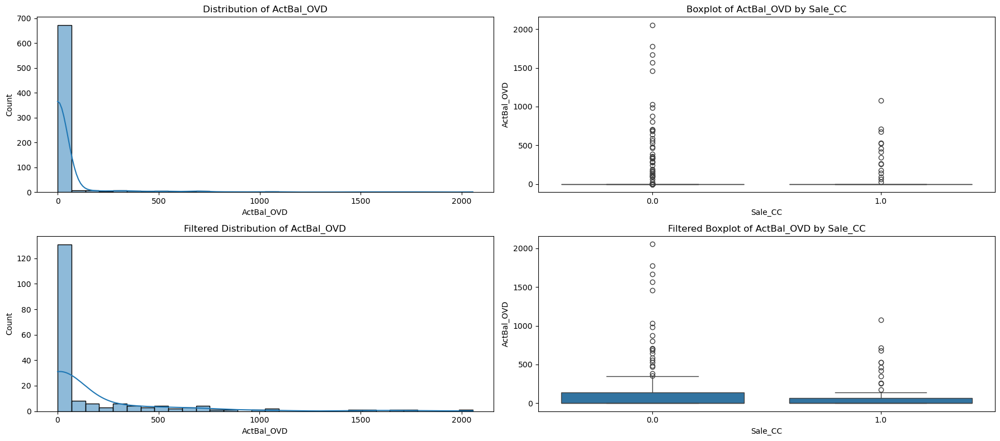

2025-01-01 12:24:54.349 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_CC


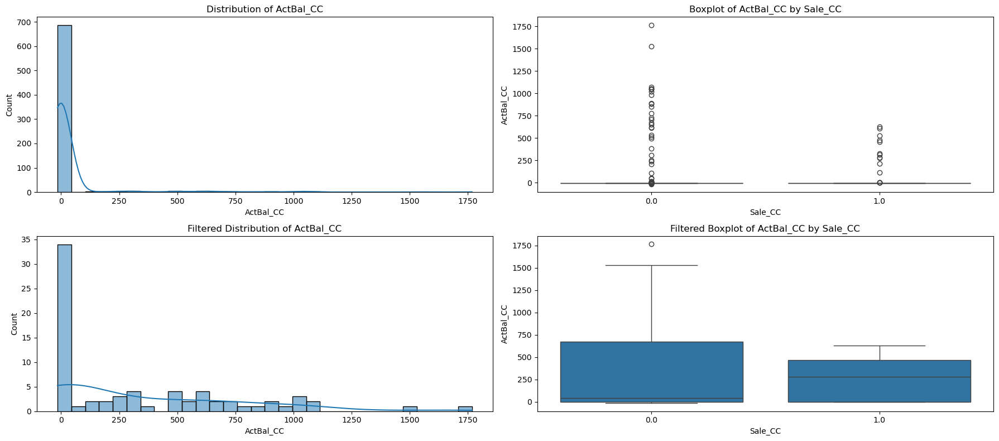

2025-01-01 12:24:54.623 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_CL


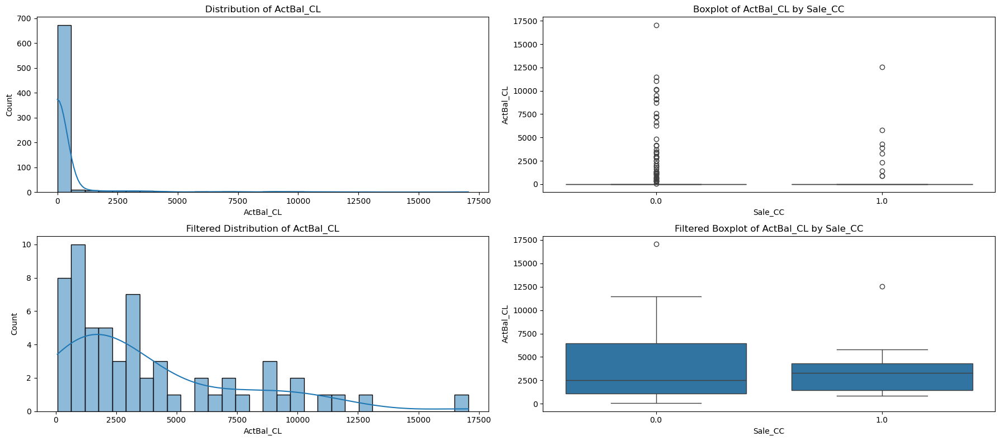

2025-01-01 12:24:54.850 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): VolumeCred


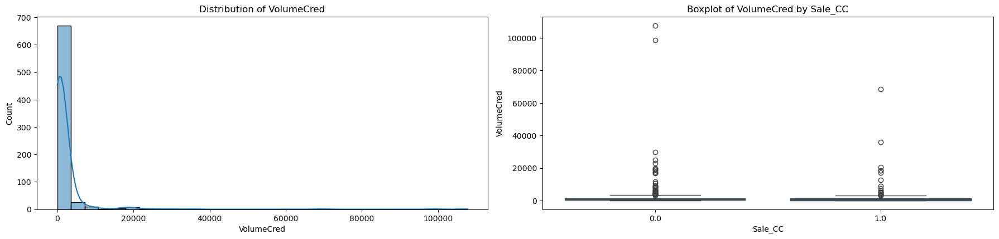

2025-01-01 12:24:54.967 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): VolumeCred_CA


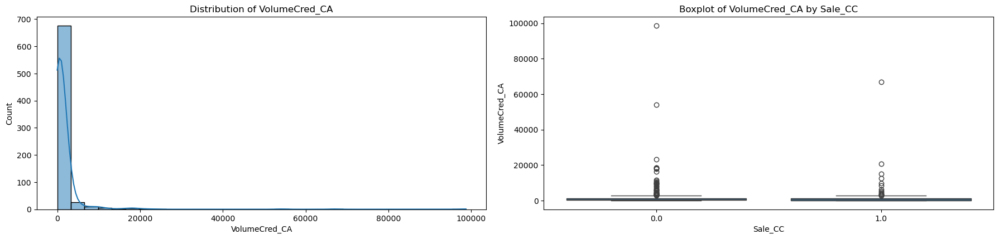

2025-01-01 12:24:55.084 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): TransactionsCred


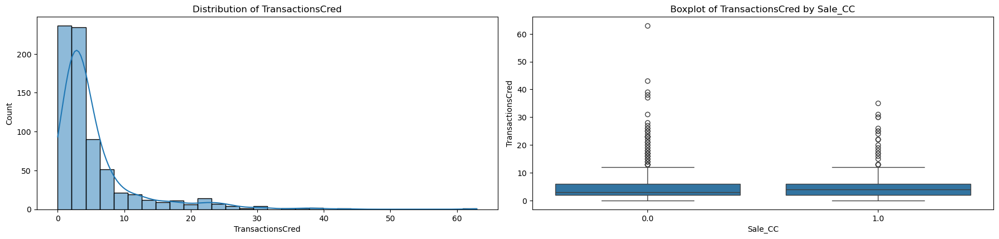

2025-01-01 12:24:55.199 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): TransactionsCred_CA


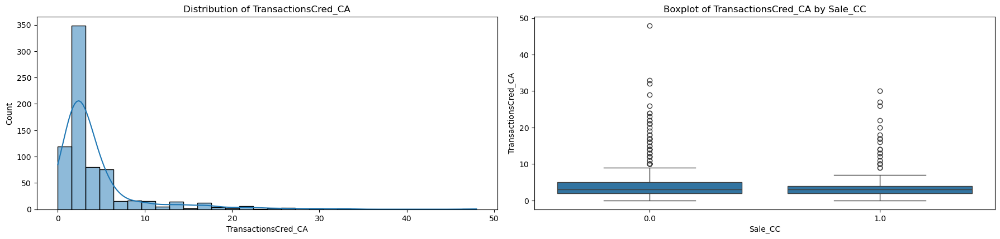

2025-01-01 12:24:55.318 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): VolumeDeb


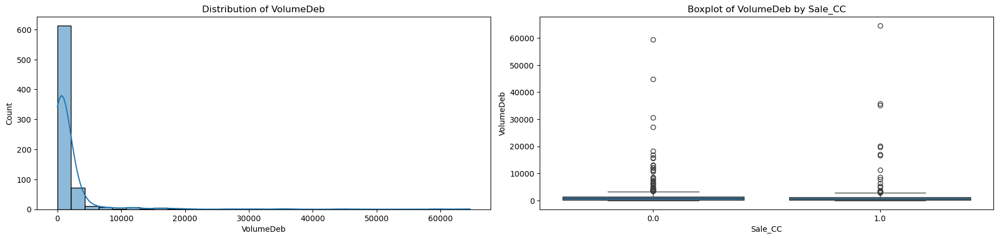

2025-01-01 12:24:55.439 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): VolumeDeb_CA


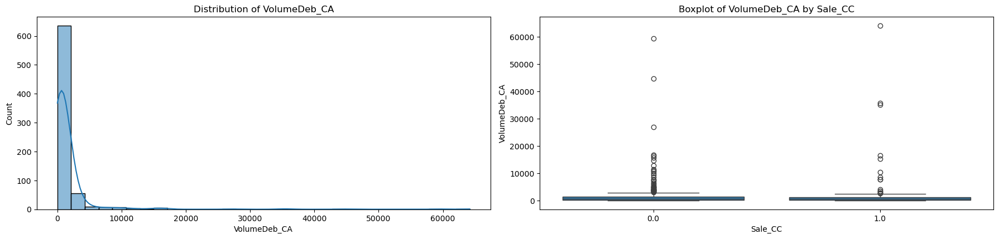

2025-01-01 12:24:55.631 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): VolumeDebCash_Card


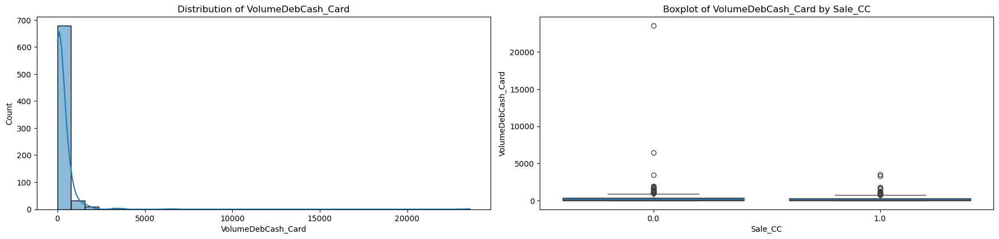

2025-01-01 12:24:55.744 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): VolumeDebCashless_Card


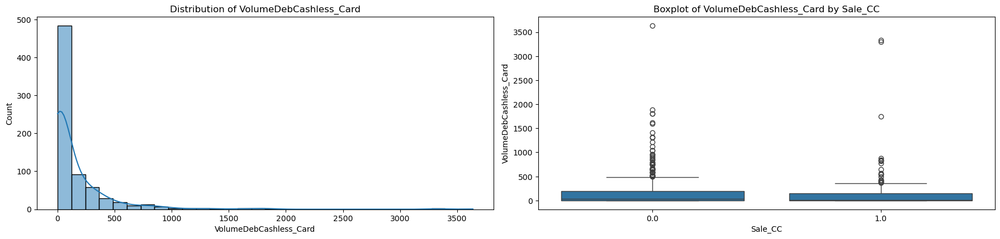

2025-01-01 12:24:55.907 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): VolumeDeb_PaymentOrder


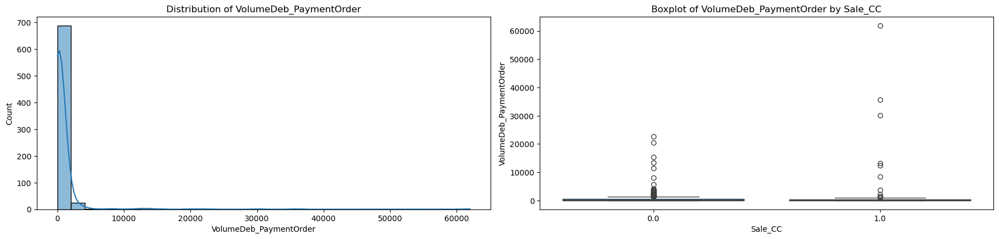

2025-01-01 12:24:56.028 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): TransactionsDeb


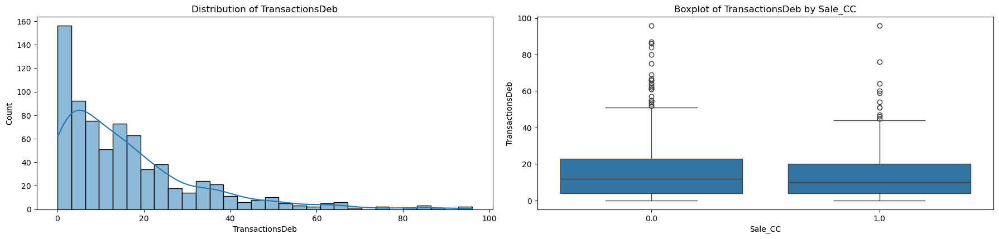

2025-01-01 12:24:56.145 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): TransactionsDeb_CA


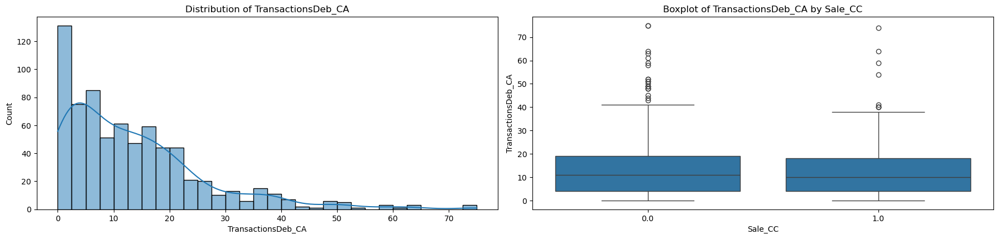

2025-01-01 12:24:56.268 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): TransactionsDebCash_Card


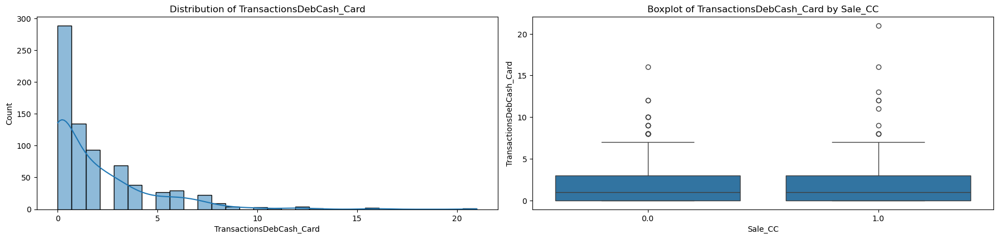

2025-01-01 12:24:56.385 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): TransactionsDebCashless_Card


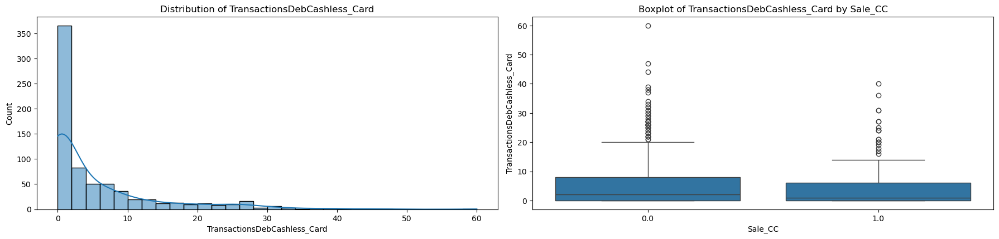

2025-01-01 12:24:56.584 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): TransactionsDeb_PaymentOrder


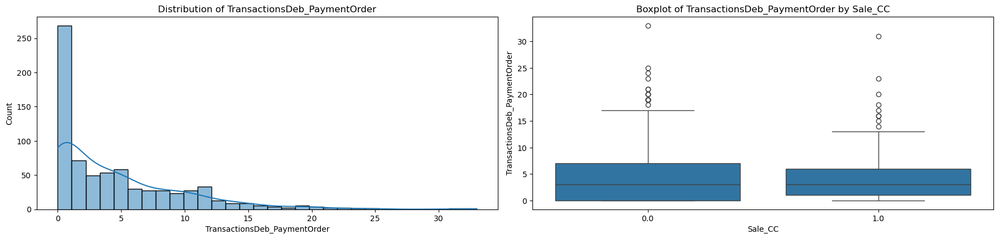

2025-01-01 12:24:56.705 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_Total_Asset


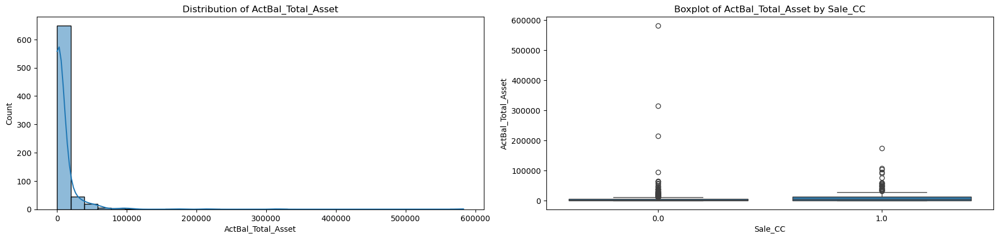

2025-01-01 12:24:56.826 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_Total_Liability


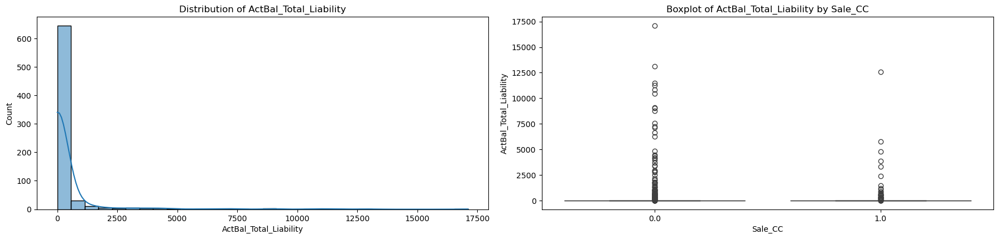

2025-01-01 12:24:56.947 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_Total


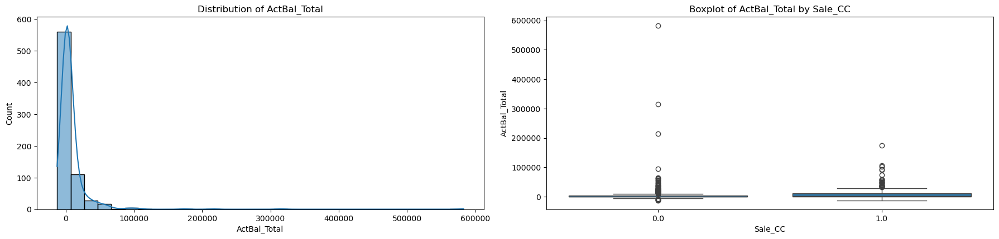

2025-01-01 12:24:57.064 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): Debt_To_Balance


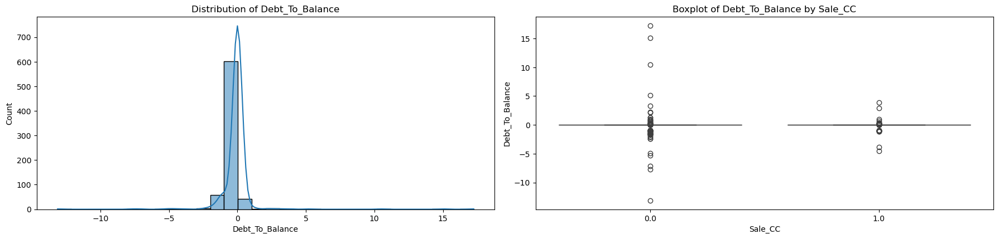

2025-01-01 12:24:57.220 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): Inflow_Outflow_Ratio


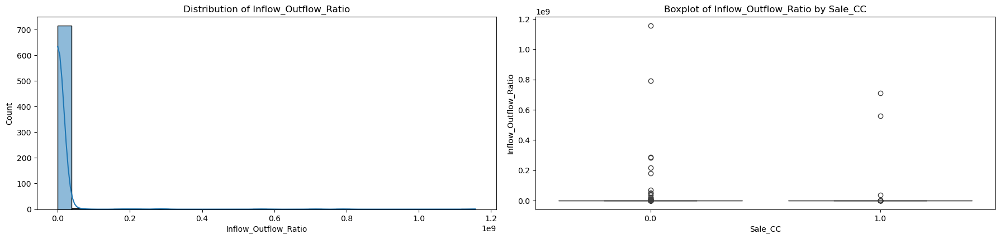

2025-01-01 12:24:57.348 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Sex


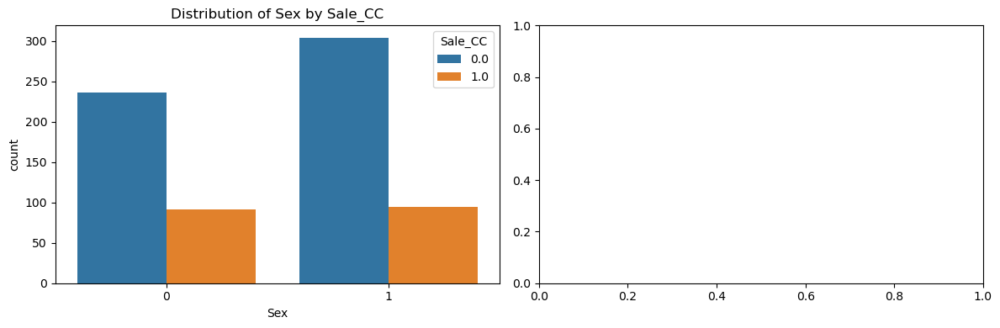

2025-01-01 12:24:57.502 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_CA


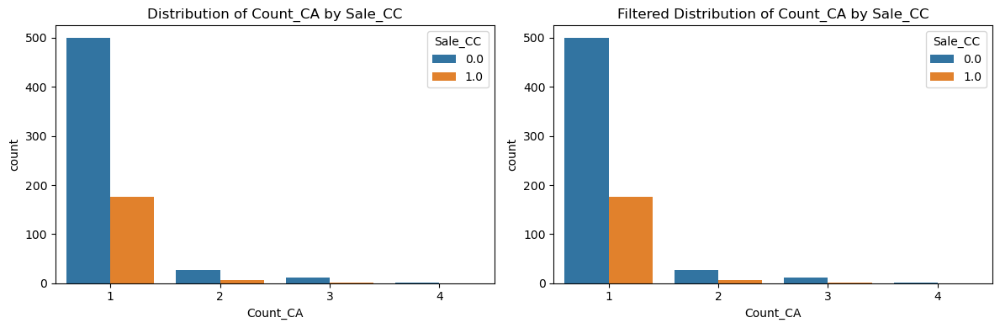

2025-01-01 12:24:57.607 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_SA


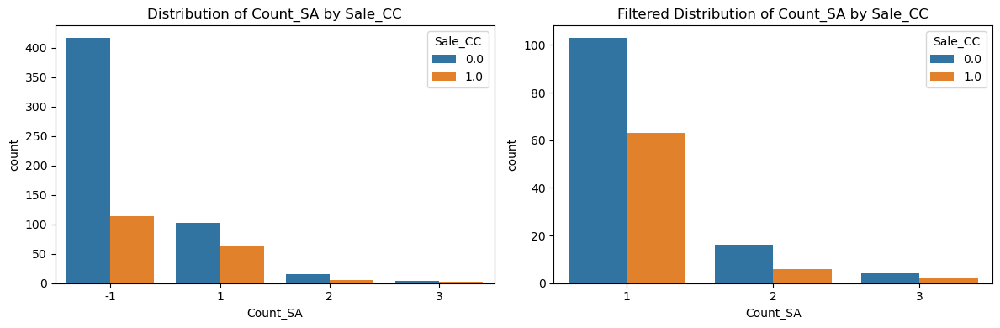

2025-01-01 12:24:57.714 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_MF


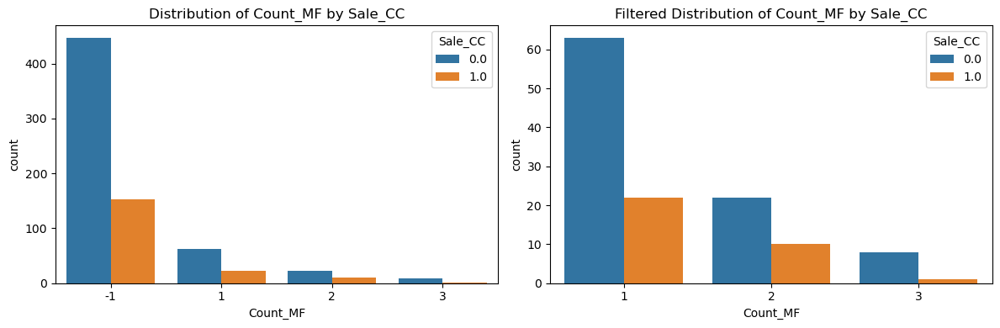

2025-01-01 12:24:57.819 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_OVD


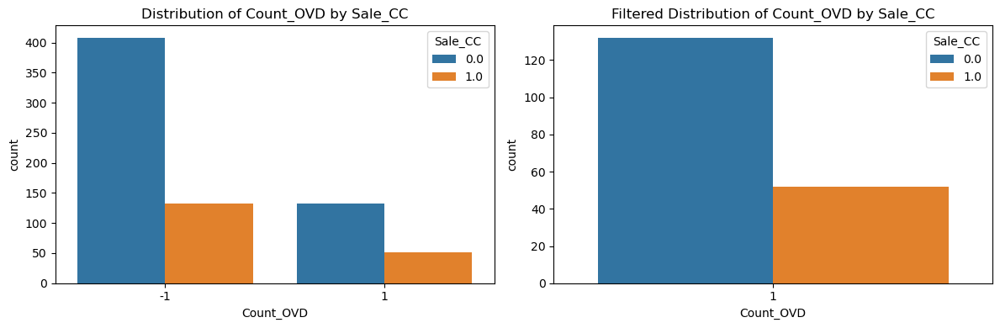

2025-01-01 12:24:57.918 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_CC


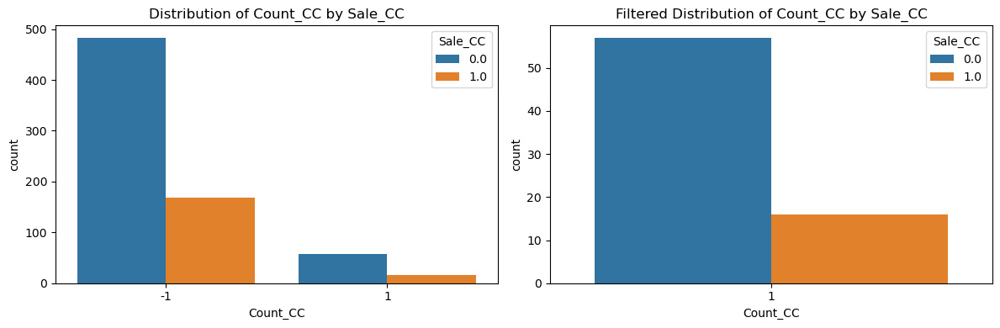

2025-01-01 12:24:58.051 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_CL


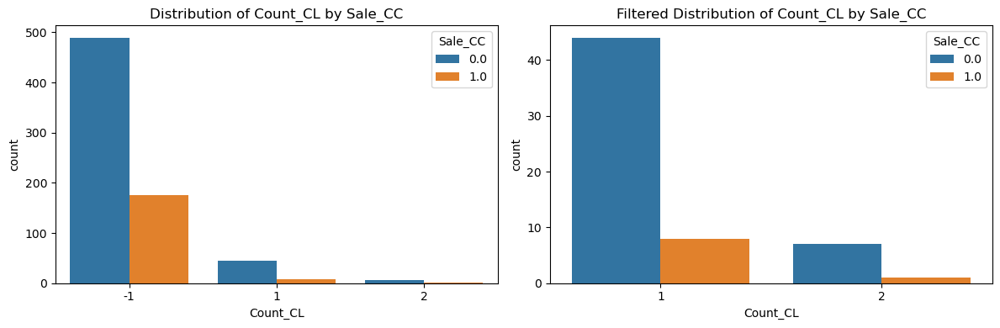

2025-01-01 12:24:58.146 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_Total_Asset


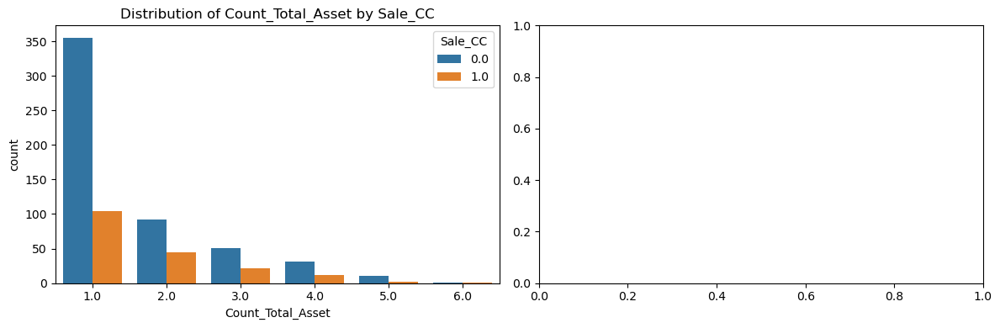

2025-01-01 12:24:58.236 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_Total_Liability


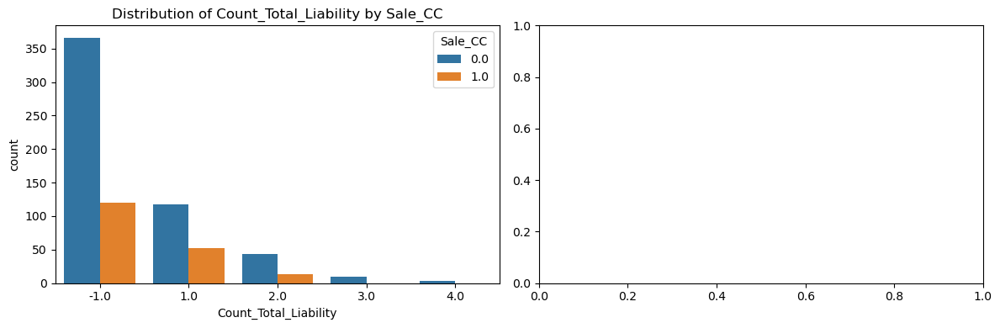

2025-01-01 12:24:58.324 | INFO     | src.eda:eda_sales_features:277 - Analyzing correlations for sales features


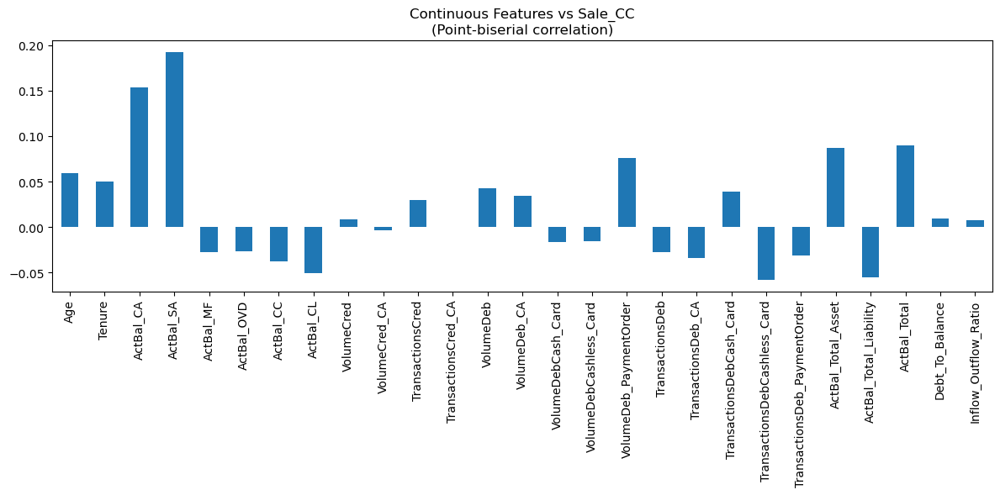

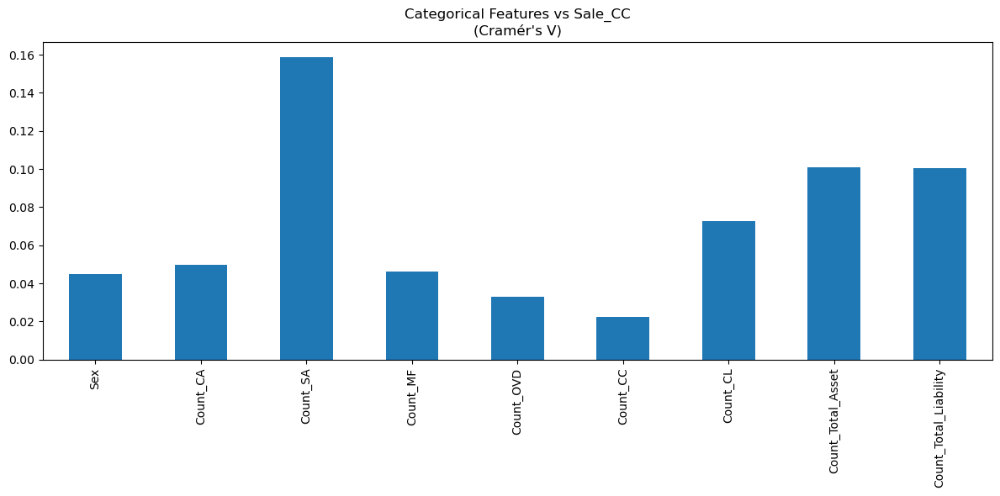

2025-01-01 12:24:58.519 | INFO     | src.eda:eda:45 - Performing EDA for Revenue
2025-01-01 12:24:58.520 | INFO     | src.eda:eda_revenue:225 - EDA for Revenue Target
2025-01-01 12:24:58.522 | INFO     | src.eda:print_table:70 - 
+-------+--------------------+--------------------+---------------------+-------------------+-------------------+-------------------+--------------------+
| count |        mean        |        std         |         min         |        25%        |        50%        |        75%        |        max         |
+-------+--------------------+--------------------+---------------------+-------------------+-------------------+-------------------+--------------------+
| 185.0 | 11.426250965250963 | 37.823988796805835 | 0.07142857142857142 | 2.138571428571429 | 4.357142857142857 | 6.964285714285714 | 407.96250000000003 |
+-------+--------------------+--------------------+---------------------+-------------------+-------------------+-------------------+-----------------

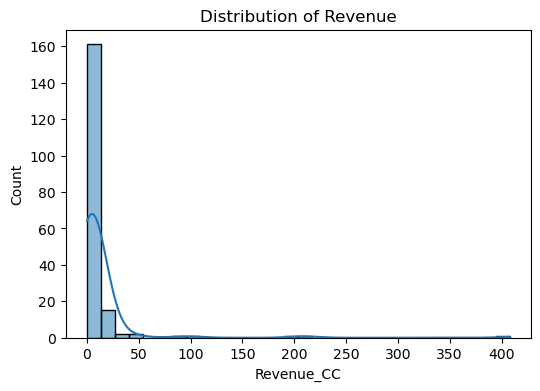

2025-01-01 12:24:58.658 | INFO     | src.eda:eda:47 - Performing EDA for Revenue-related Features
2025-01-01 12:24:58.659 | INFO     | src.eda:eda_revenue_features:288 - Analyzing correlations for revenue features


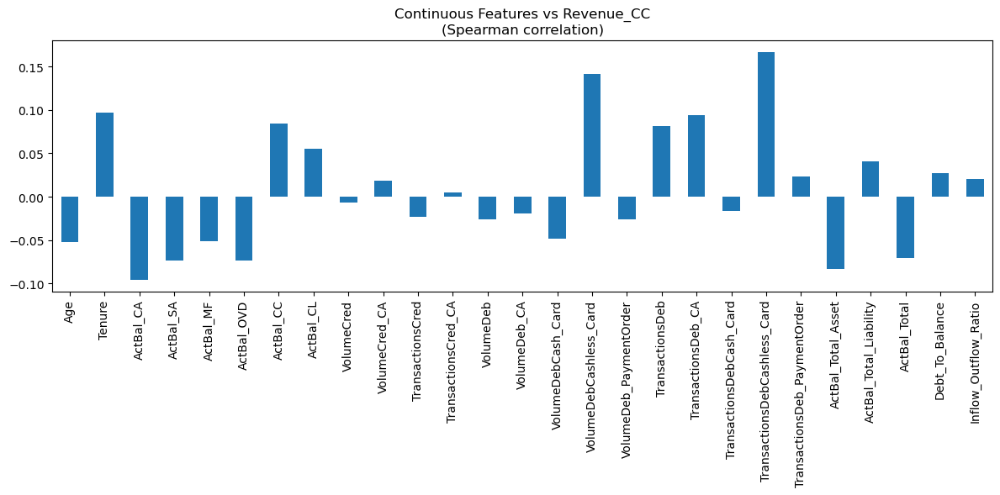

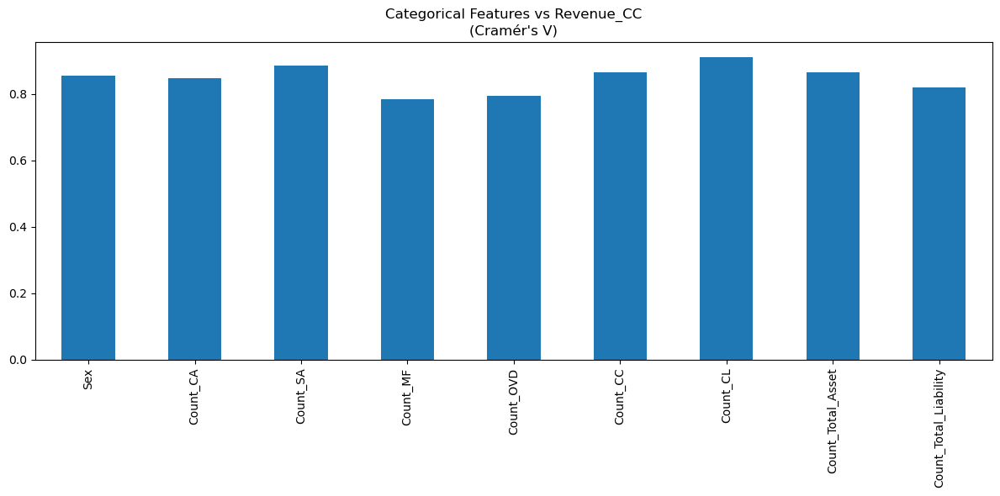

2025-01-01 12:24:58.892 | INFO     | src.eda:eda:51 - Performing Continuous Features Correlation Analysis


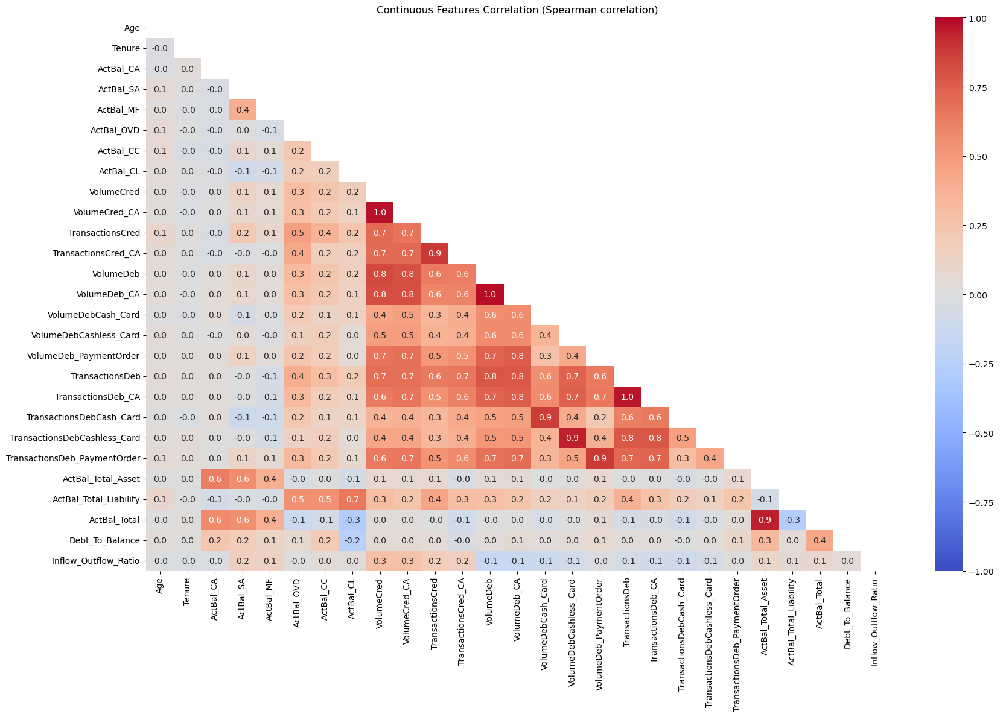

2025-01-01 12:24:59.218 | INFO     | src.eda:eda:53 - Performing Categorical vs Categorical Correlation Analysis


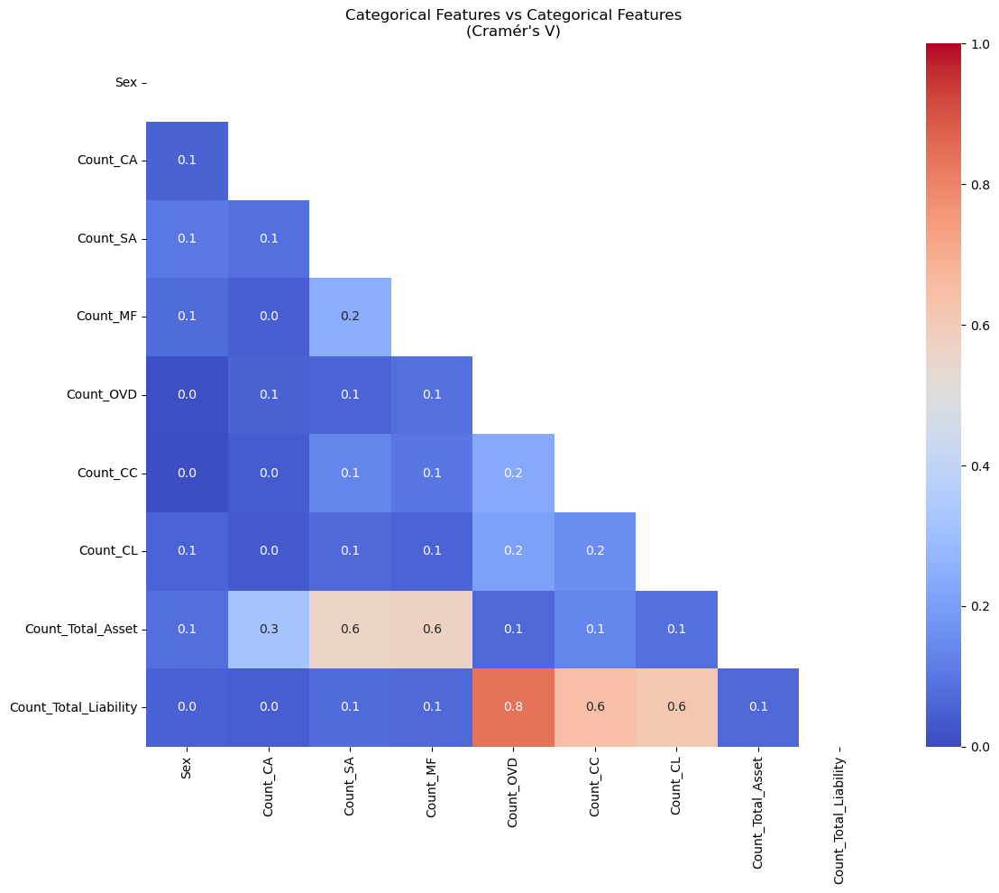

2025-01-01 12:24:59.371 | INFO     | src.eda:eda:55 - Performing Categorical vs Continuous Correlation Analysis


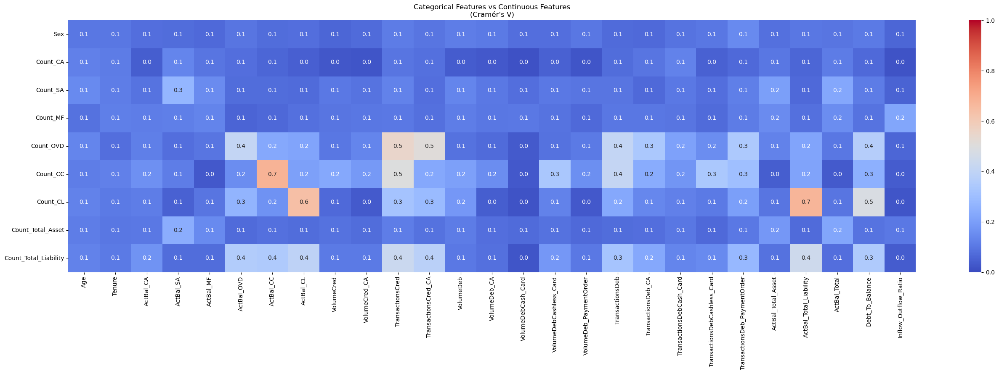

2025-01-01 12:25:00.380 | INFO     | src.eda:eda:34 - Performing EDA for Sale
2025-01-01 12:25:00.380 | INFO     | src.eda:eda_sales:210 - EDA for Sale Target
2025-01-01 12:25:00.381 | INFO     | src.eda:print_table:70 - 
+------------+------------------------------------------+
| Sale Value |                Percentage                |
+------------+------------------------------------------+
| [0.0, 1.0] | [0.7172413793103448, 0.2827586206896552] |
+------------+------------------------------------------+


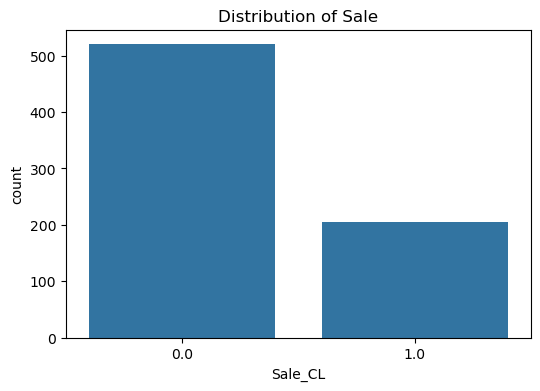

2025-01-01 12:25:00.417 | INFO     | src.eda:eda:36 - Performing EDA for Sale-related Features
2025-01-01 12:25:00.417 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): Age


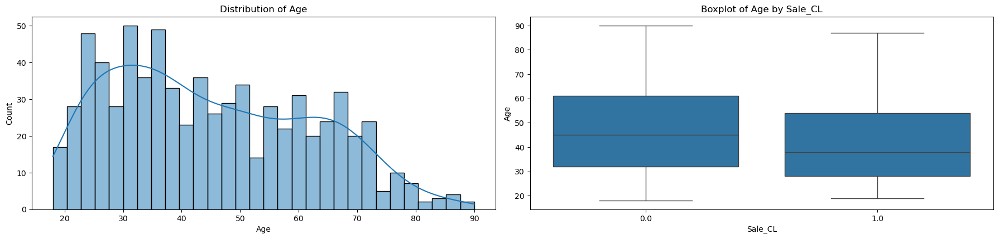

2025-01-01 12:25:00.573 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): Tenure


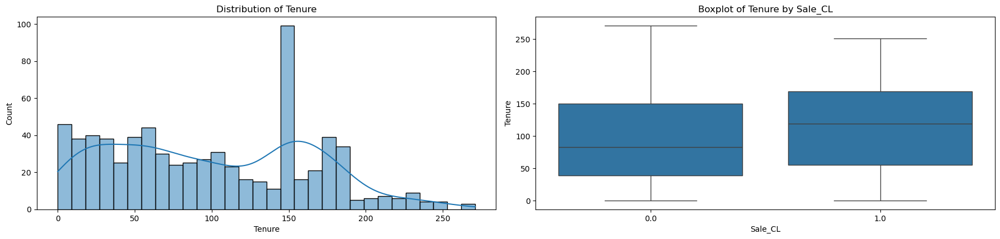

2025-01-01 12:25:00.686 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_CA


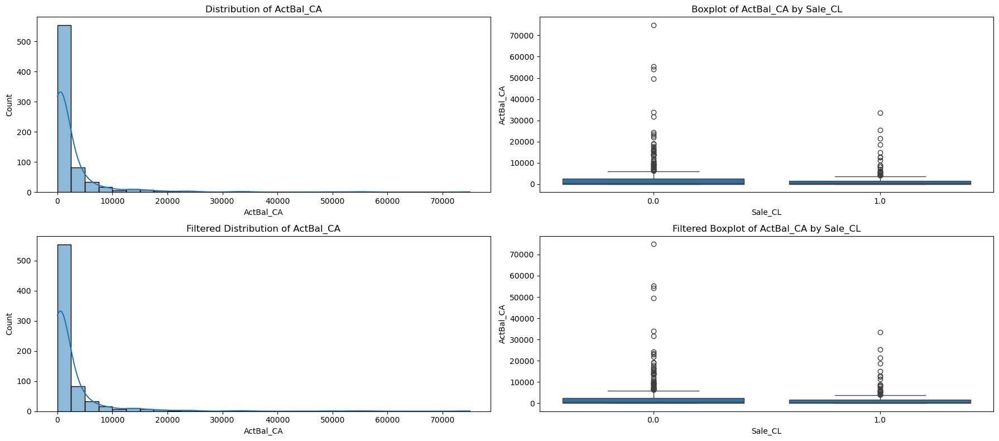

2025-01-01 12:25:00.948 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_SA


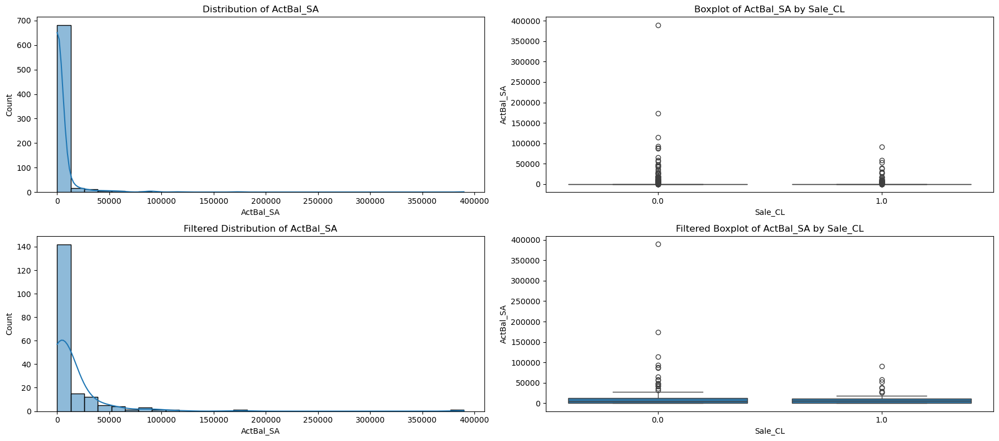

2025-01-01 12:25:01.179 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_MF


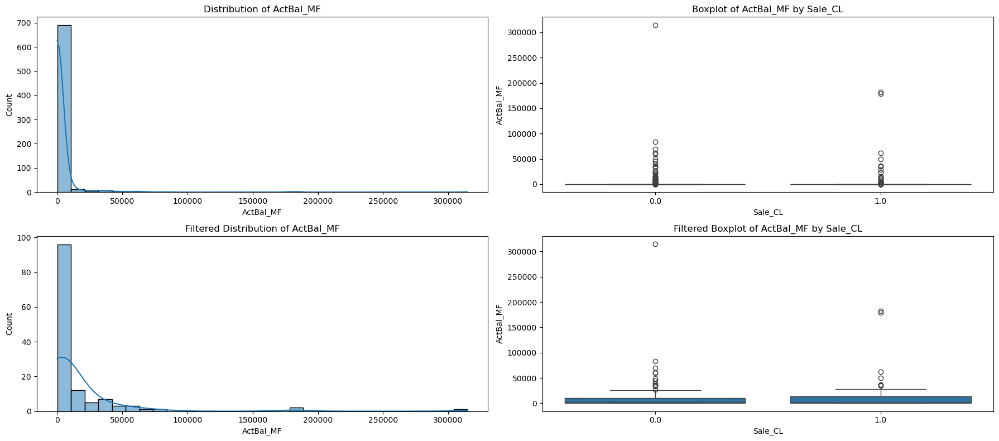

2025-01-01 12:25:01.391 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_OVD


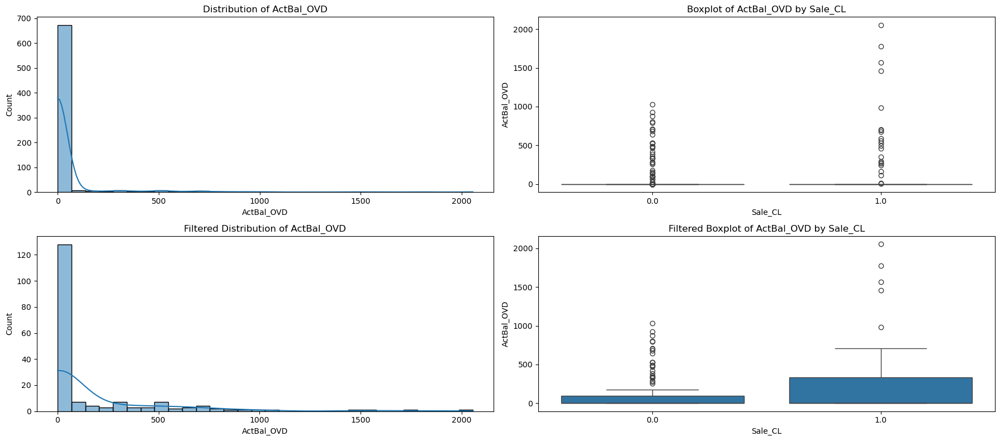

2025-01-01 12:25:01.599 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_CC


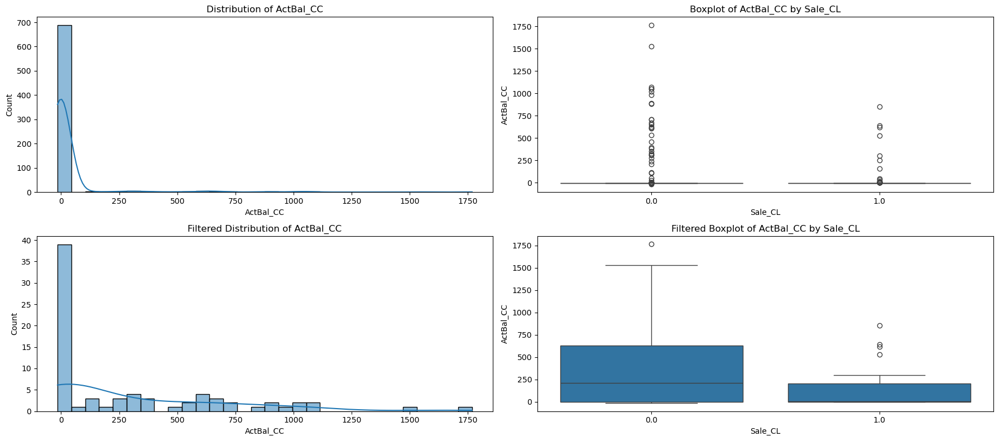

2025-01-01 12:25:01.923 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_CL


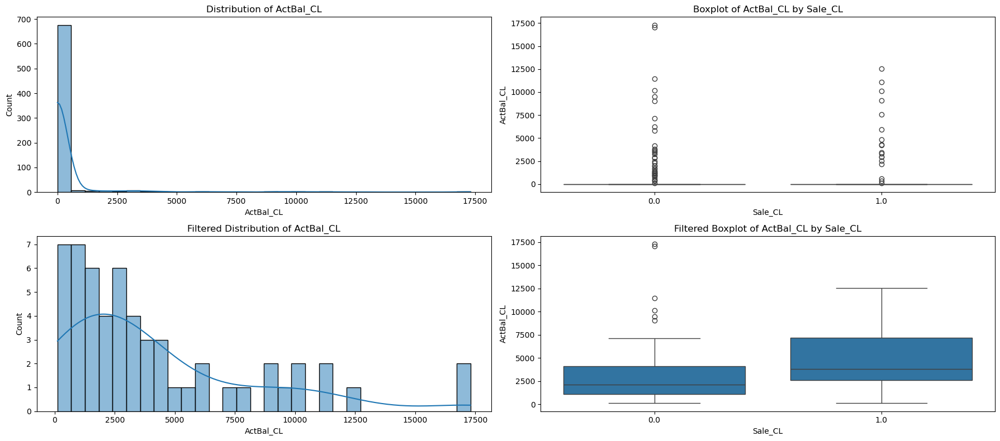

2025-01-01 12:25:02.149 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): VolumeCred


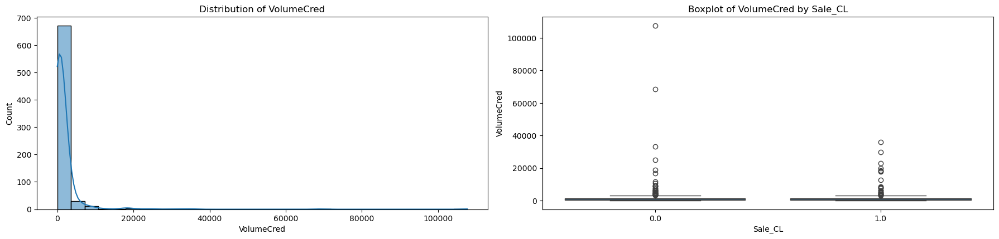

2025-01-01 12:25:02.264 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): VolumeCred_CA


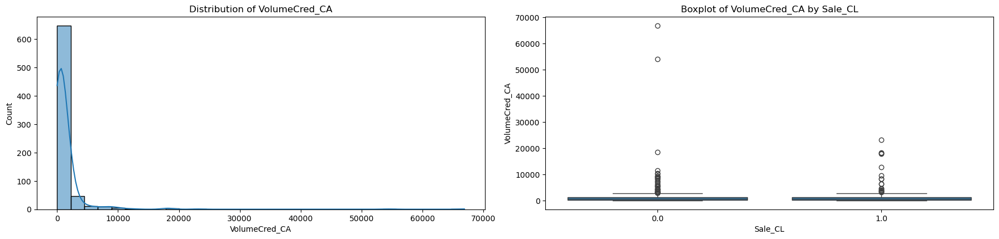

2025-01-01 12:25:02.385 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): TransactionsCred


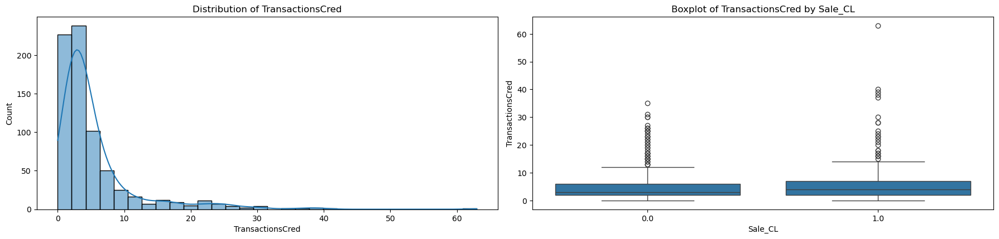

2025-01-01 12:25:02.499 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): TransactionsCred_CA


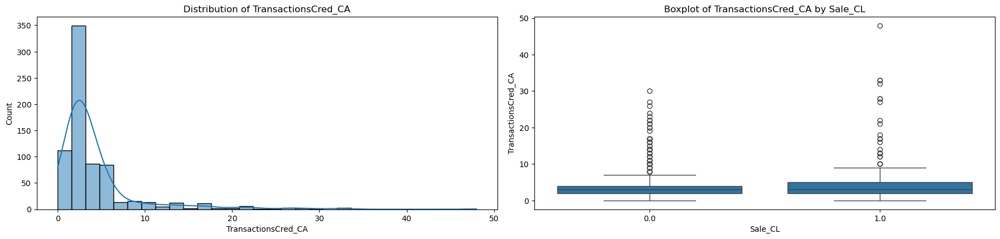

2025-01-01 12:25:02.617 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): VolumeDeb


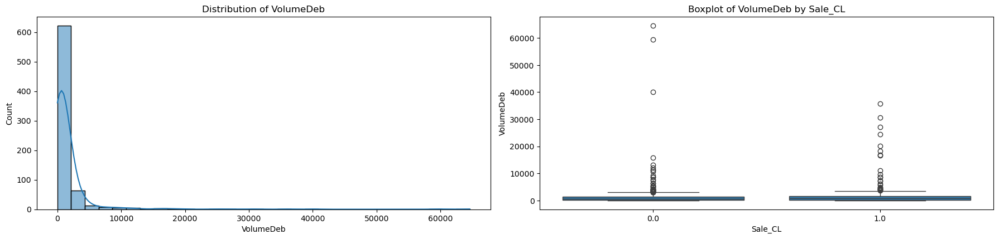

2025-01-01 12:25:02.779 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): VolumeDeb_CA


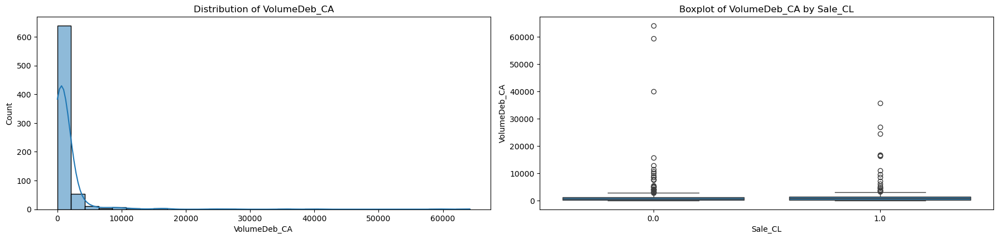

2025-01-01 12:25:02.975 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): VolumeDebCash_Card


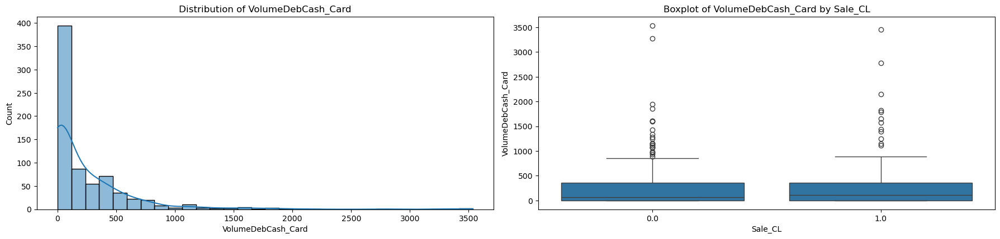

2025-01-01 12:25:03.102 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): VolumeDebCashless_Card


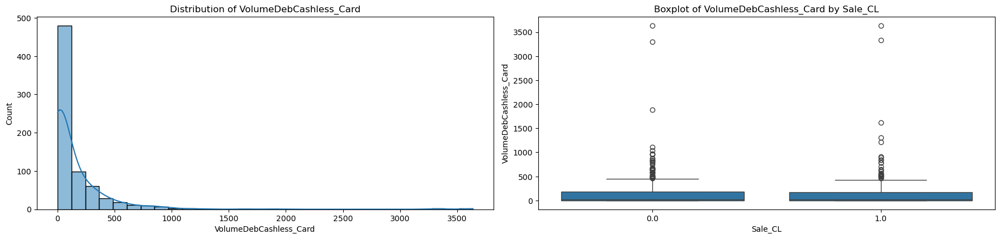

2025-01-01 12:25:03.225 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): VolumeDeb_PaymentOrder


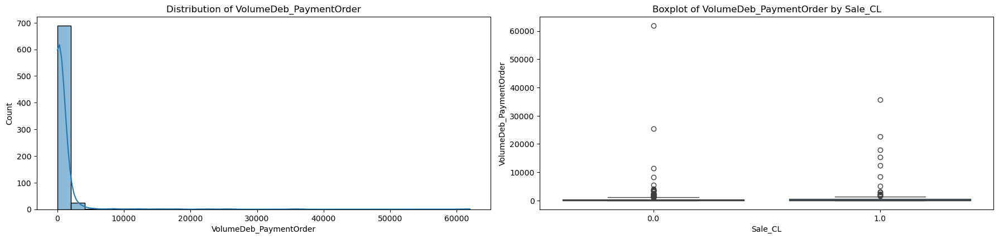

2025-01-01 12:25:03.387 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): TransactionsDeb


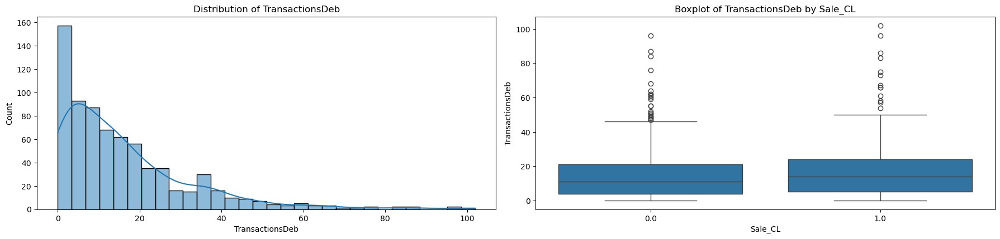

2025-01-01 12:25:03.508 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): TransactionsDeb_CA


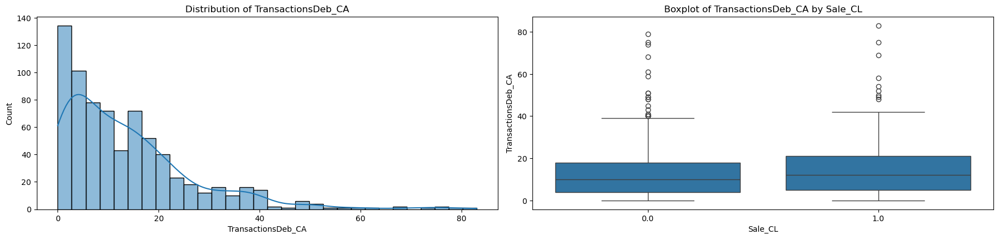

2025-01-01 12:25:03.626 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): TransactionsDebCash_Card


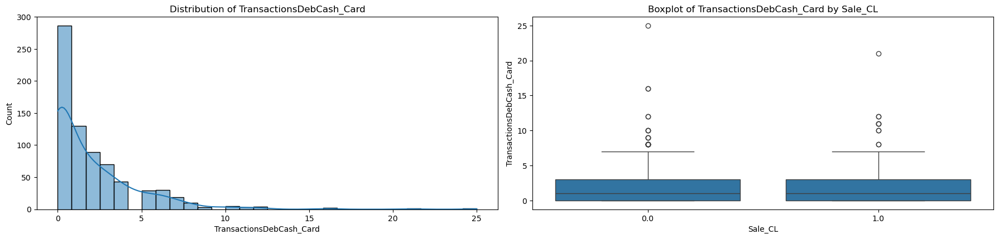

2025-01-01 12:25:03.745 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): TransactionsDebCashless_Card


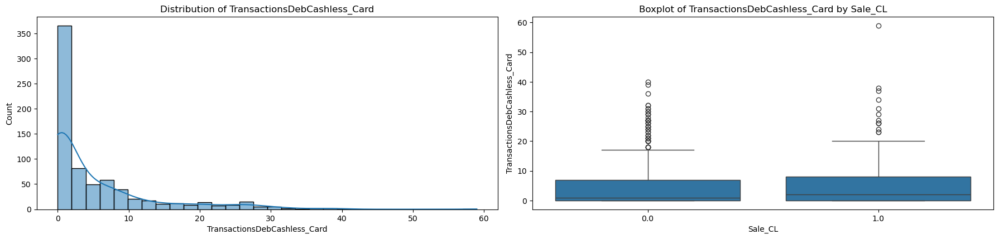

2025-01-01 12:25:03.949 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): TransactionsDeb_PaymentOrder


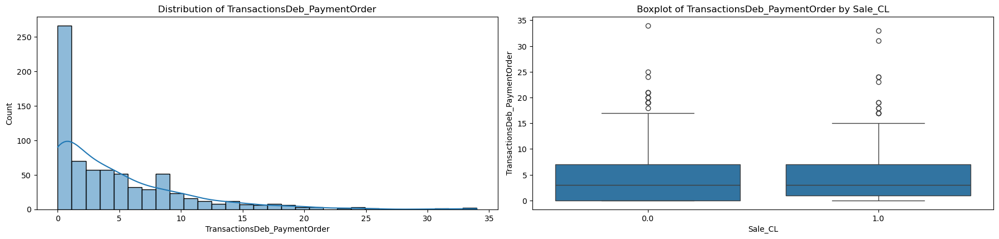

2025-01-01 12:25:04.110 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_Total_Asset


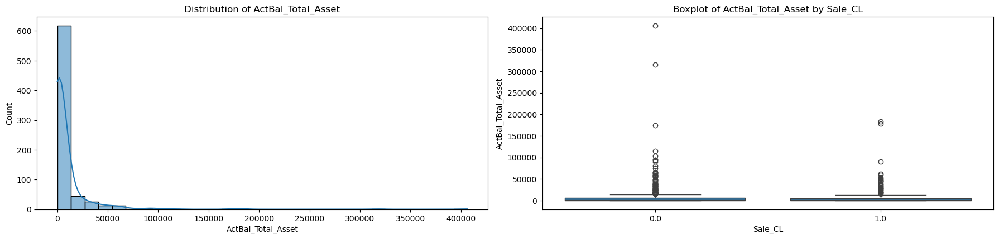

2025-01-01 12:25:04.232 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_Total_Liability


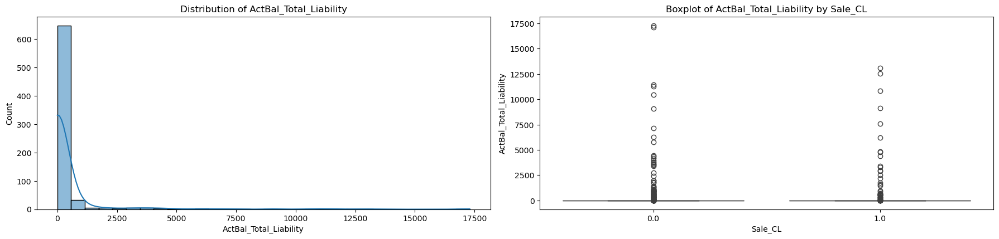

2025-01-01 12:25:04.351 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_Total


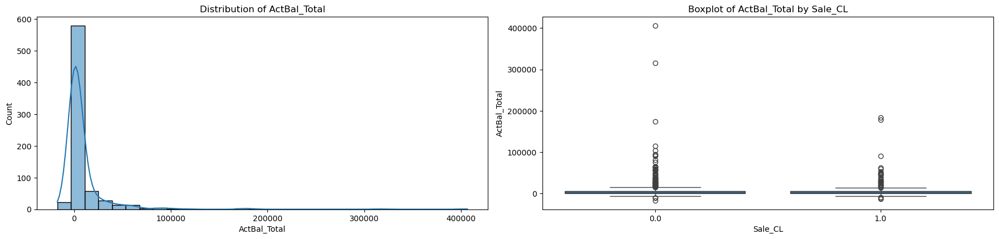

2025-01-01 12:25:04.463 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): Debt_To_Balance


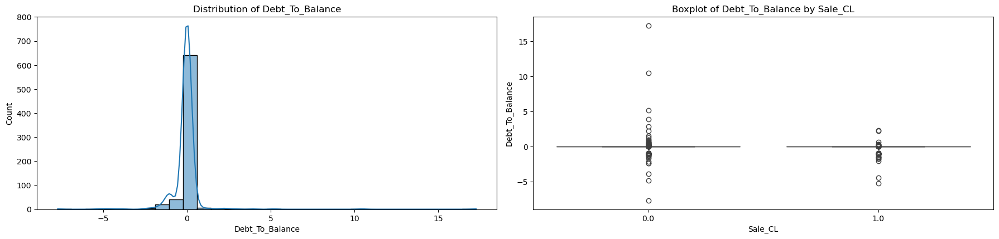

2025-01-01 12:25:04.620 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): Inflow_Outflow_Ratio


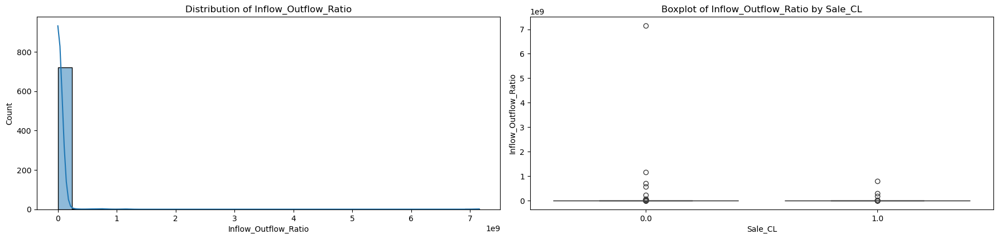

2025-01-01 12:25:04.736 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Sex


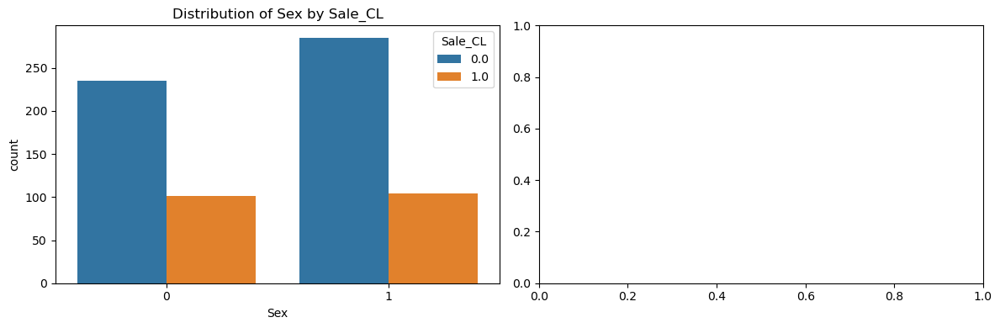

2025-01-01 12:25:04.884 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_CA


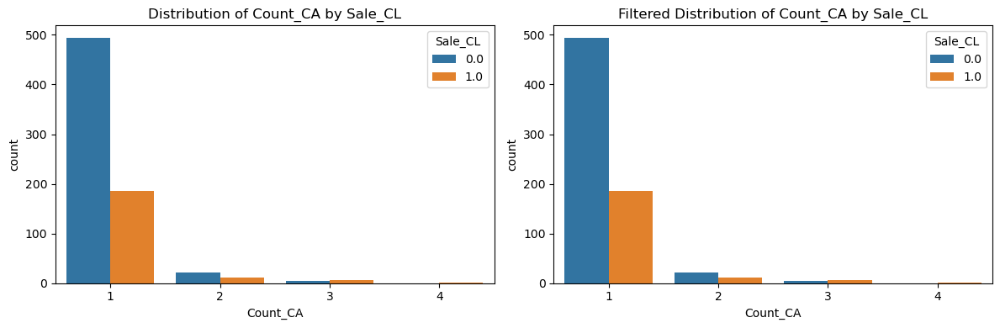

2025-01-01 12:25:04.990 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_SA


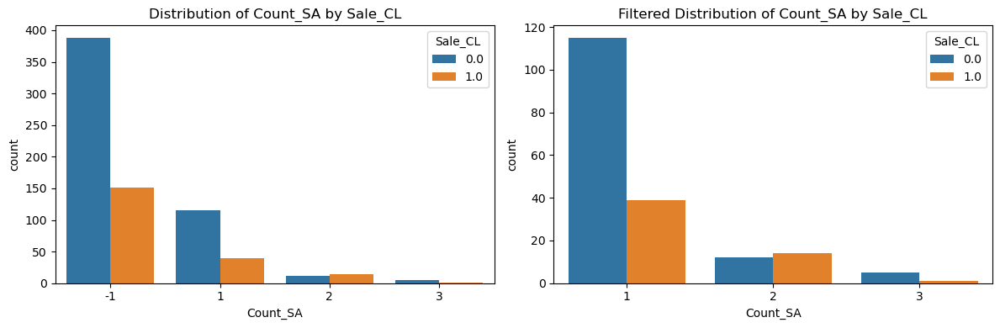

2025-01-01 12:25:05.099 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_MF


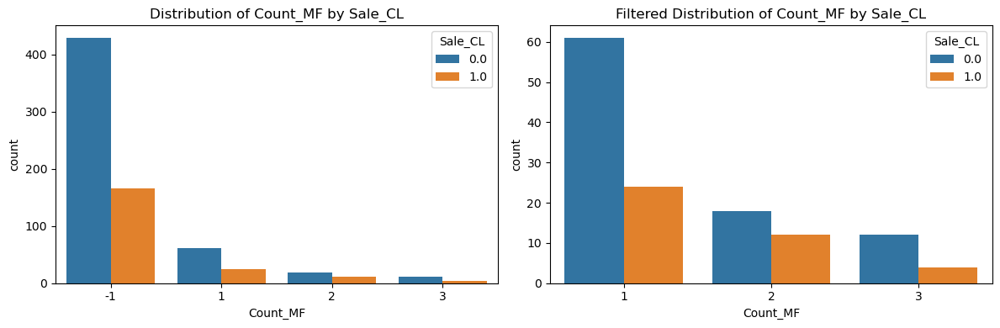

2025-01-01 12:25:05.201 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_OVD


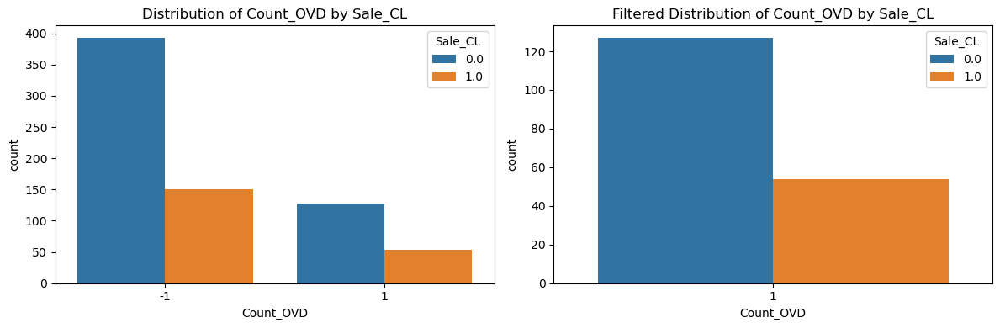

2025-01-01 12:25:05.302 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_CC


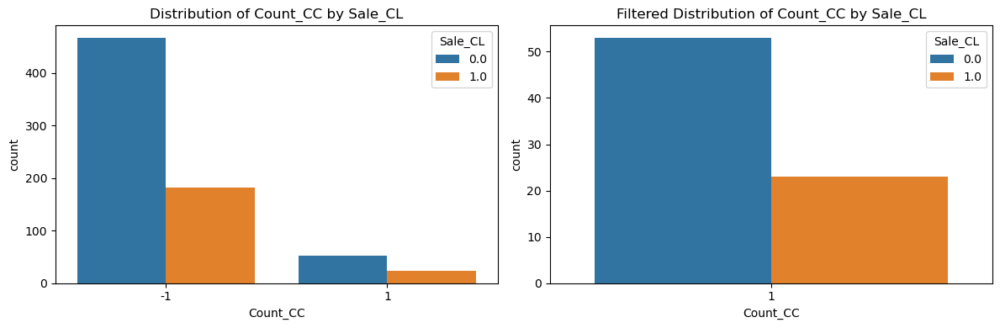

2025-01-01 12:25:05.433 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_CL


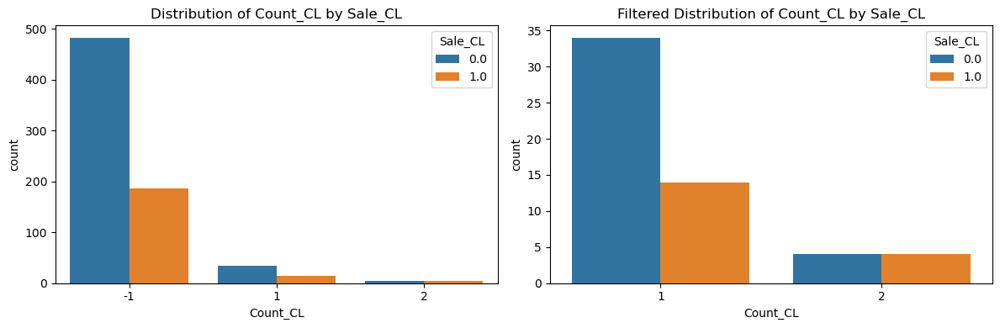

2025-01-01 12:25:05.533 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_Total_Asset


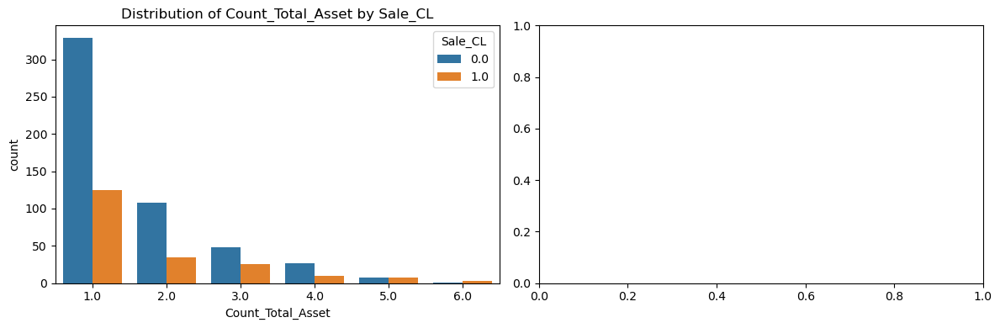

2025-01-01 12:25:05.620 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_Total_Liability


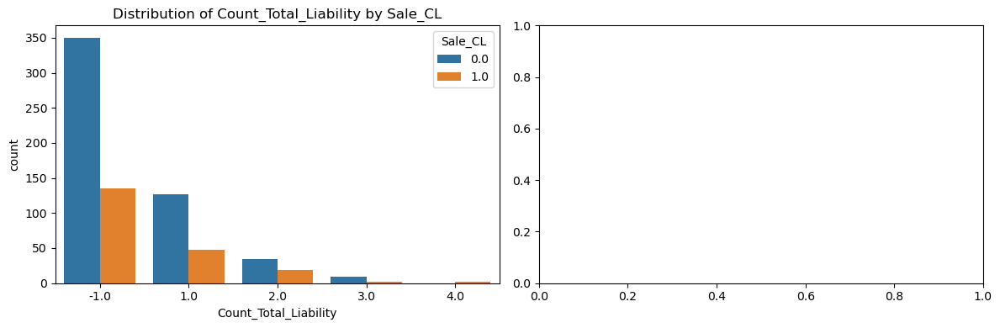

2025-01-01 12:25:05.750 | INFO     | src.eda:eda_sales_features:277 - Analyzing correlations for sales features


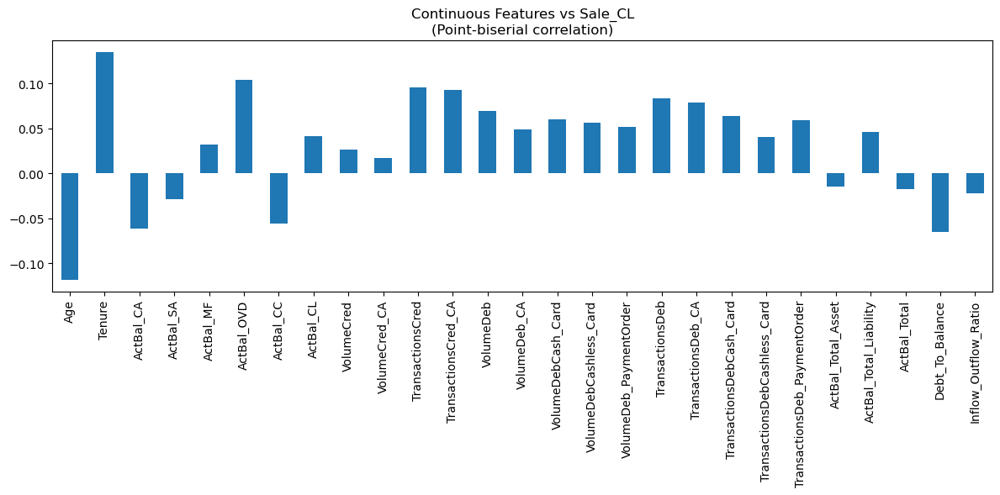

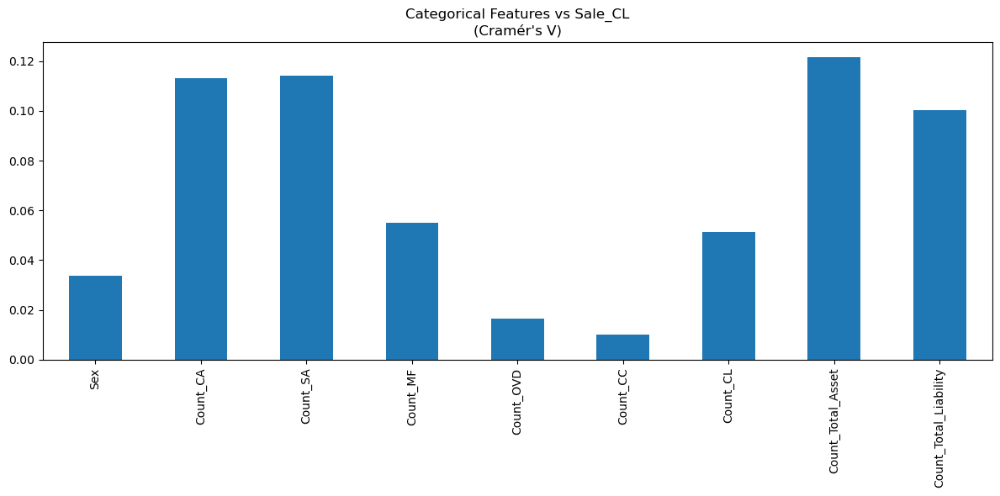

2025-01-01 12:25:05.936 | INFO     | src.eda:eda:45 - Performing EDA for Revenue
2025-01-01 12:25:05.937 | INFO     | src.eda:eda_revenue:225 - EDA for Revenue Target
2025-01-01 12:25:05.938 | INFO     | src.eda:print_table:70 - 
+-------+--------------------+--------------------+--------------------+-------------------+--------------------+---------+--------------------+
| count |        mean        |        std         |        min         |        25%        |        50%         |   75%   |        max         |
+-------+--------------------+--------------------+--------------------+-------------------+--------------------+---------+--------------------+
| 205.0 | 11.513980836236934 | 10.735235319356109 | 1.0714285714285714 | 5.801785714285714 | 10.333571428571428 | 14.2075 | 133.27535714285713 |
+-------+--------------------+--------------------+--------------------+-------------------+--------------------+---------+--------------------+


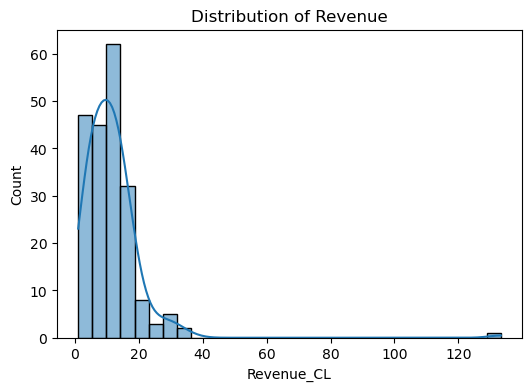

2025-01-01 12:25:05.992 | INFO     | src.eda:eda:47 - Performing EDA for Revenue-related Features
2025-01-01 12:25:05.993 | INFO     | src.eda:eda_revenue_features:288 - Analyzing correlations for revenue features


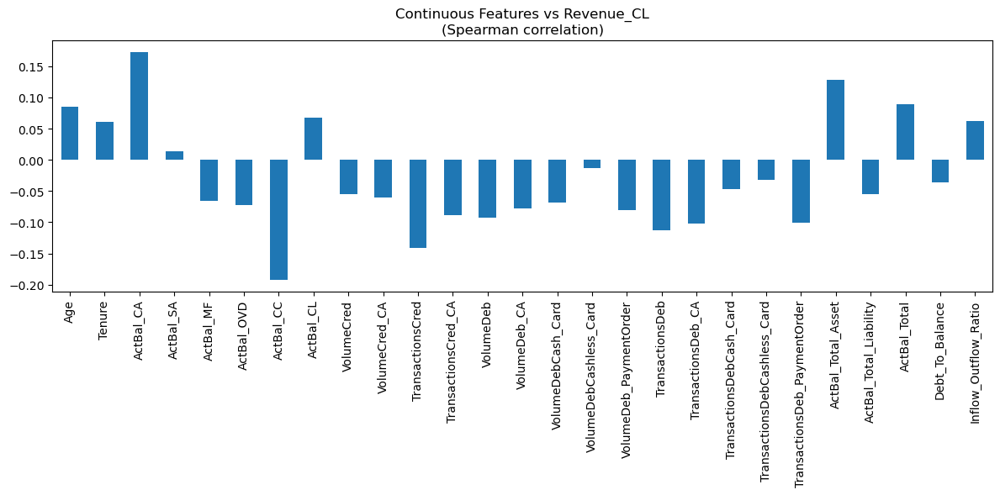

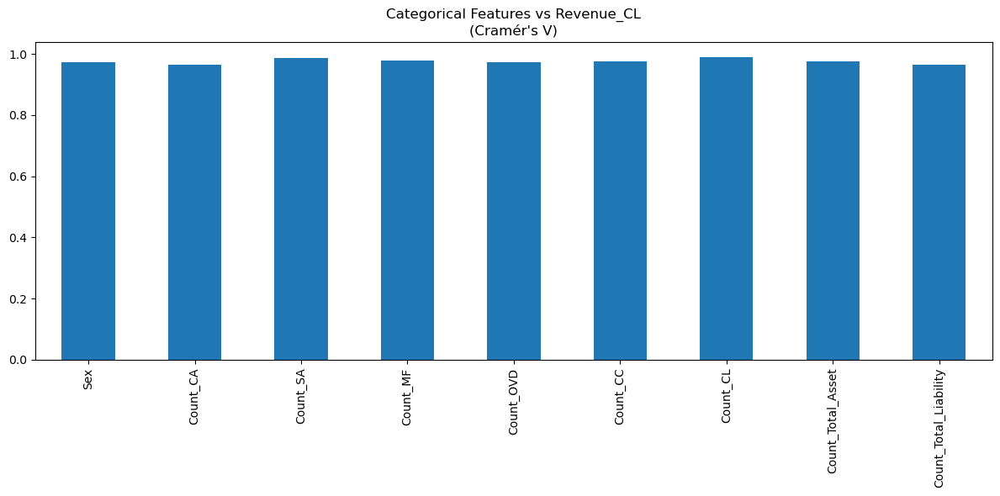

2025-01-01 12:25:06.232 | INFO     | src.eda:eda:51 - Performing Continuous Features Correlation Analysis


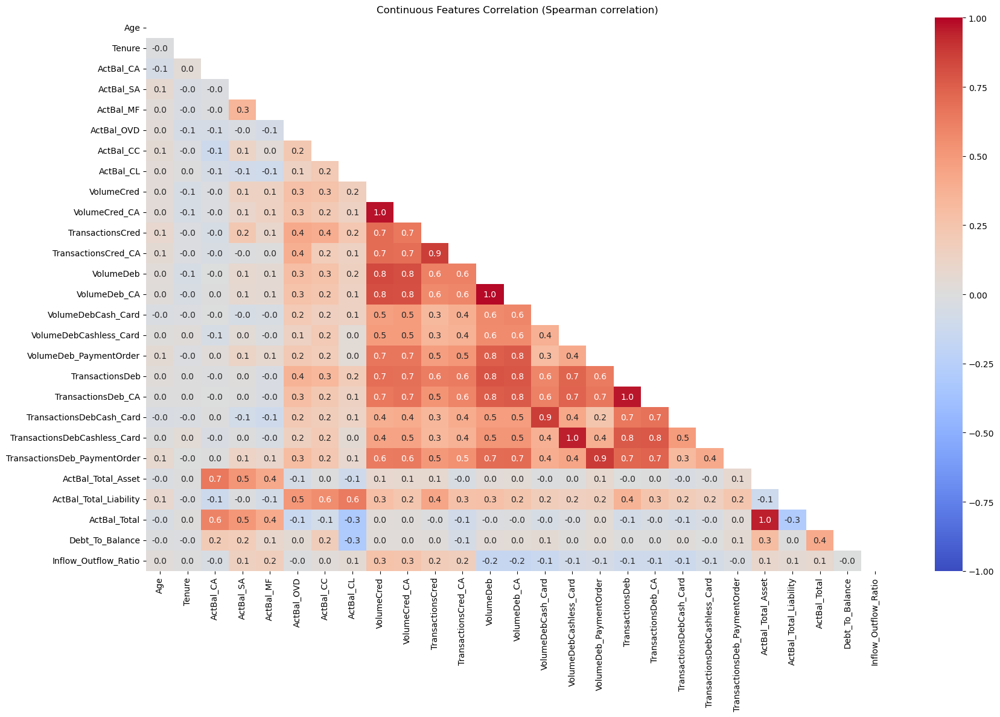

2025-01-01 12:25:06.647 | INFO     | src.eda:eda:53 - Performing Categorical vs Categorical Correlation Analysis


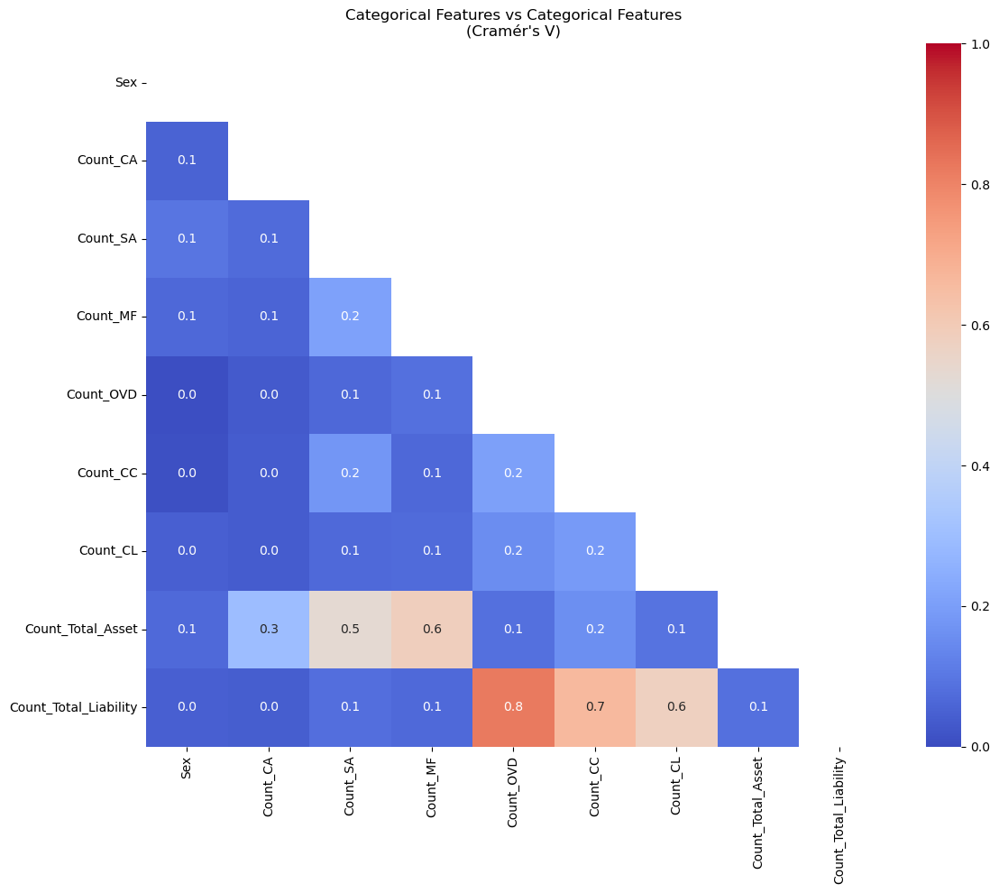

2025-01-01 12:25:06.806 | INFO     | src.eda:eda:55 - Performing Categorical vs Continuous Correlation Analysis


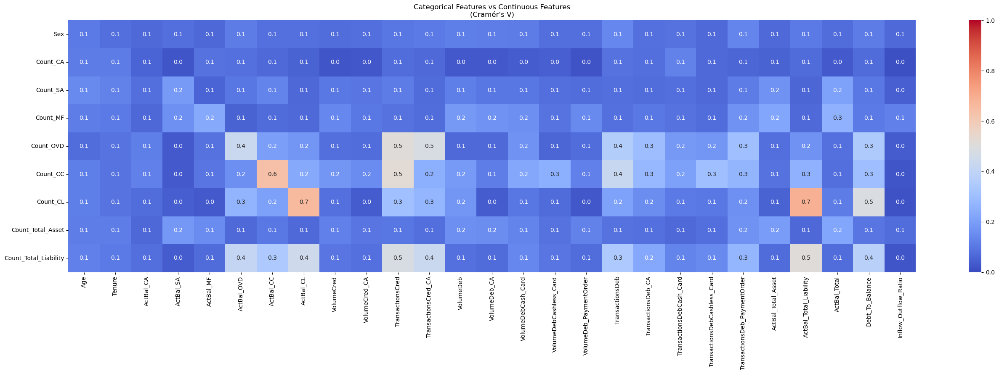

2025-01-01 12:25:07.766 | INFO     | src.eda:eda:34 - Performing EDA for Sale
2025-01-01 12:25:07.766 | INFO     | src.eda:eda_sales:210 - EDA for Sale Target
2025-01-01 12:25:07.767 | INFO     | src.eda:print_table:70 - 
+------------+------------+
| Sale Value | Percentage |
+------------+------------+
| [0.0, 1.0] | [0.8, 0.2] |
+------------+------------+


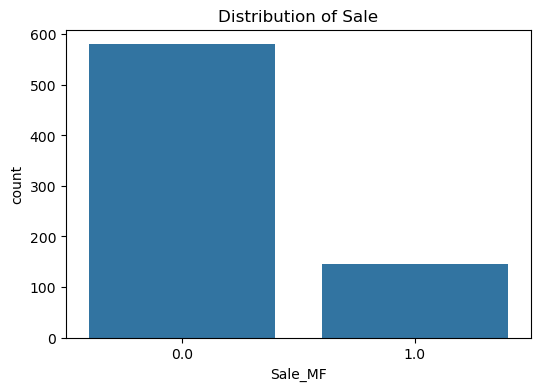

2025-01-01 12:25:07.805 | INFO     | src.eda:eda:36 - Performing EDA for Sale-related Features
2025-01-01 12:25:07.805 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): Age


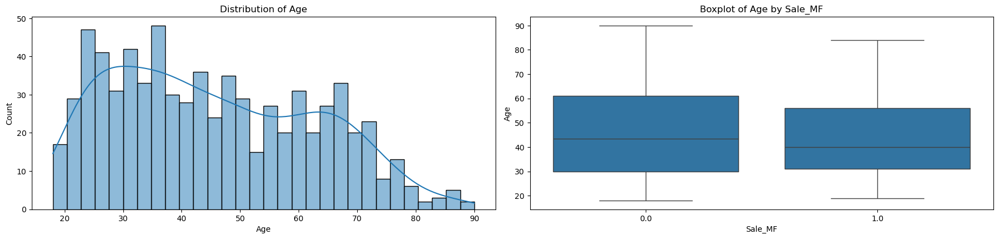

2025-01-01 12:25:07.964 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): Tenure


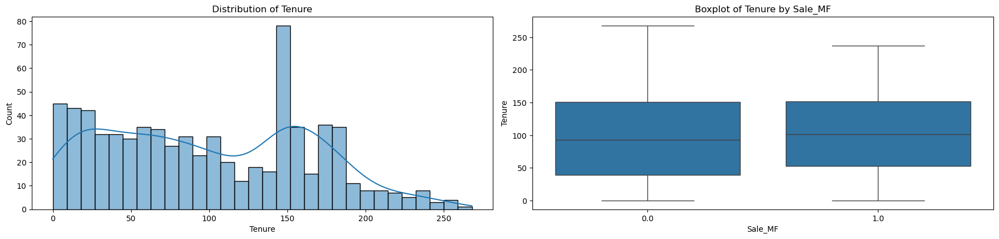

2025-01-01 12:25:08.080 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_CA


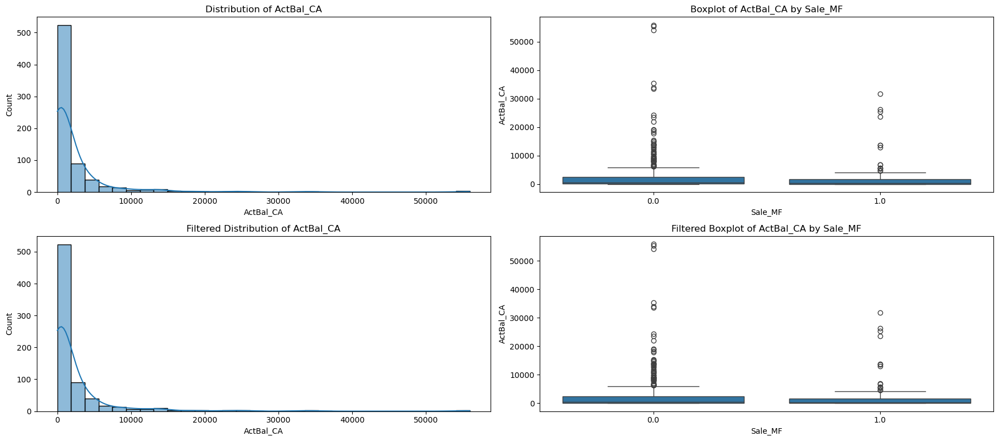

2025-01-01 12:25:08.287 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_SA


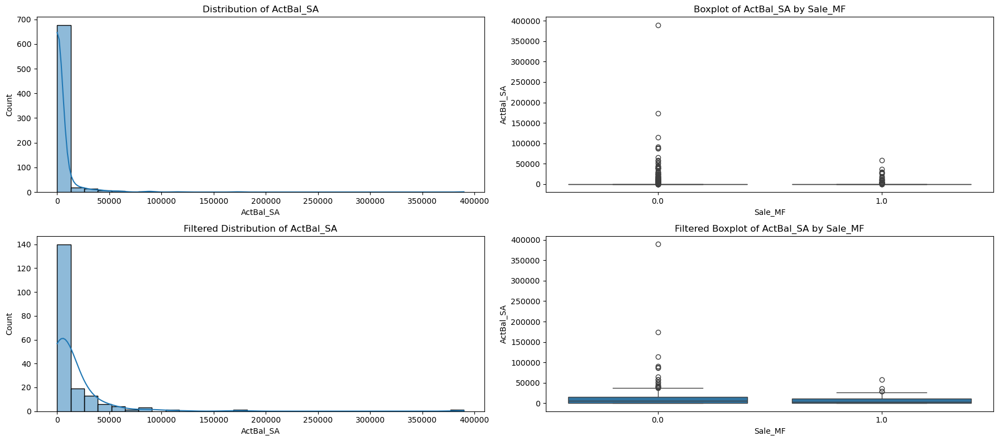

2025-01-01 12:25:08.514 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_MF


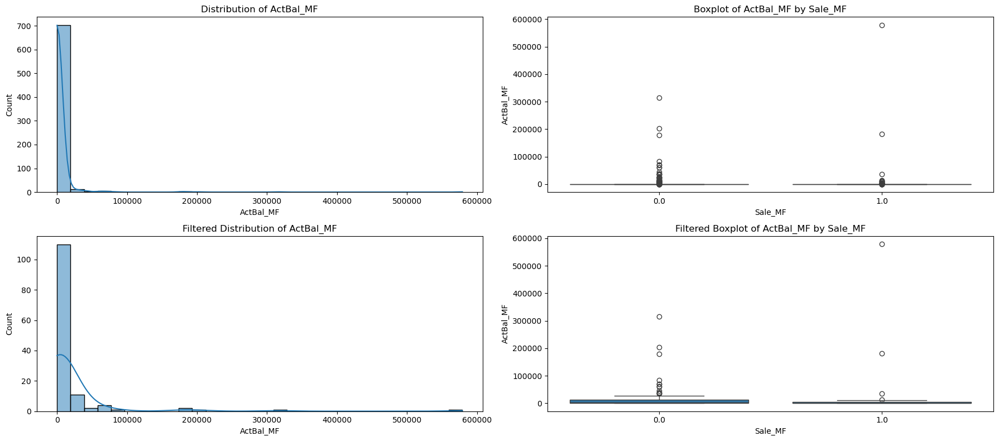

2025-01-01 12:25:08.818 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_OVD


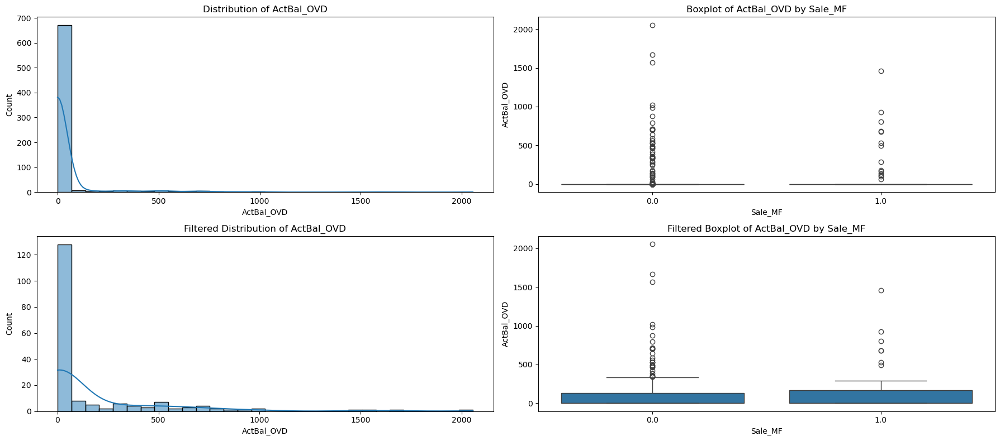

2025-01-01 12:25:09.020 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_CC


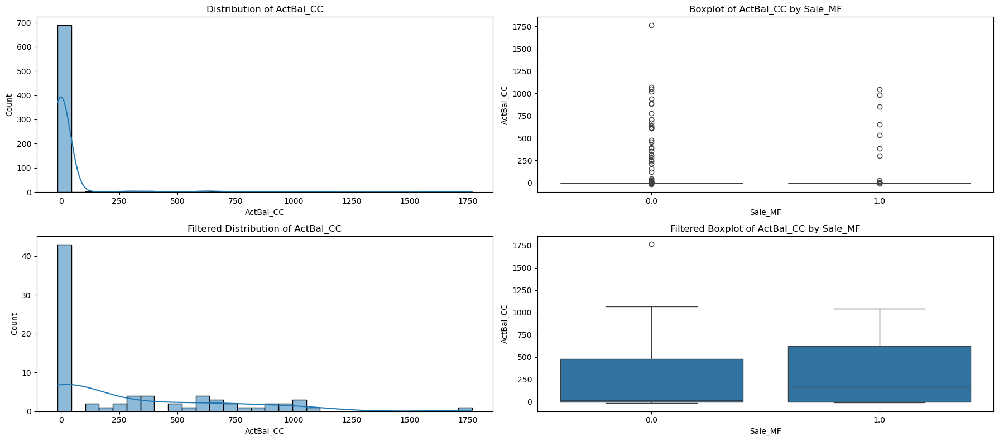

2025-01-01 12:25:09.231 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_CL


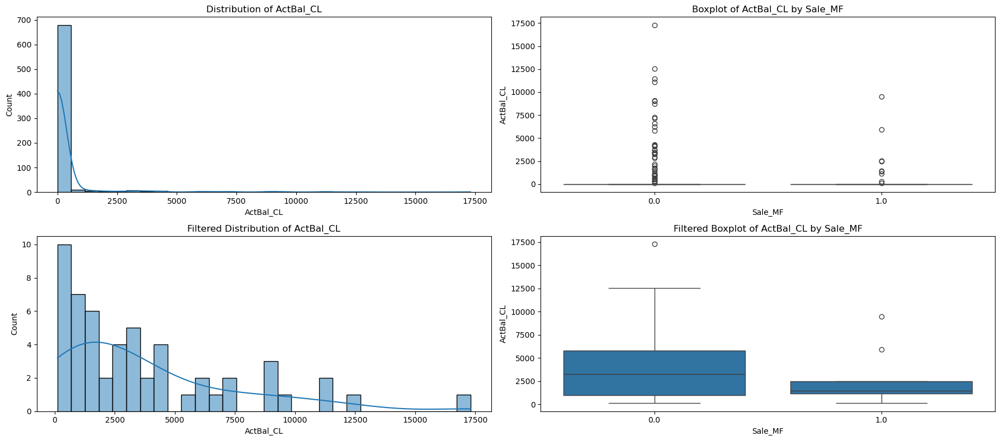

2025-01-01 12:25:09.492 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): VolumeCred


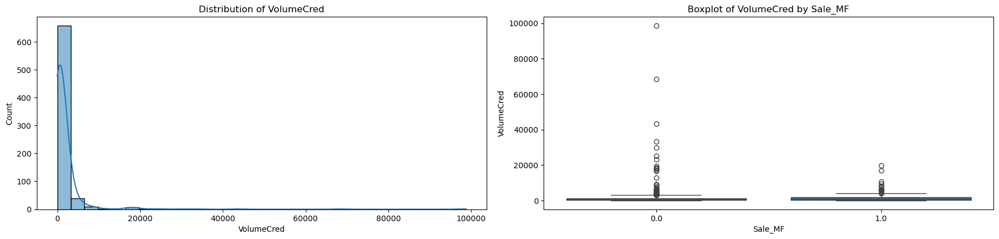

2025-01-01 12:25:09.605 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): VolumeCred_CA


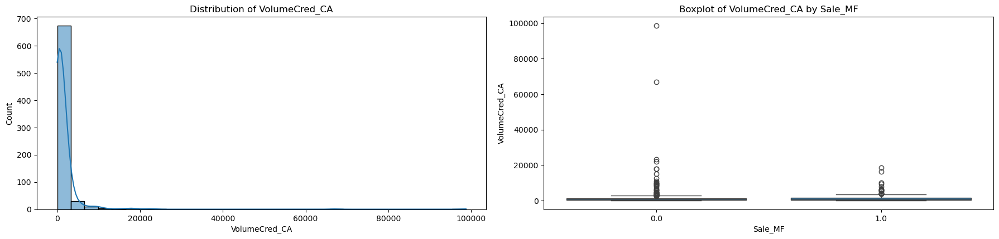

2025-01-01 12:25:09.780 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): TransactionsCred


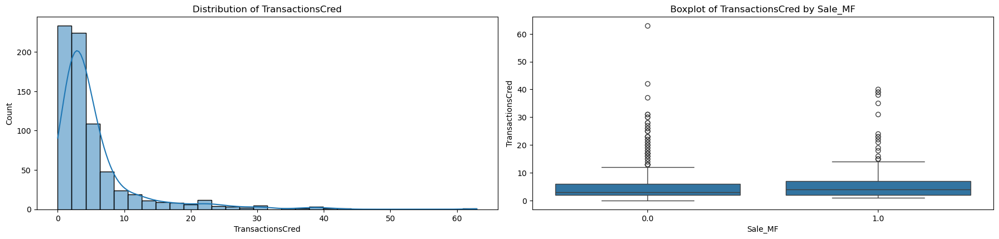

2025-01-01 12:25:09.947 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): TransactionsCred_CA


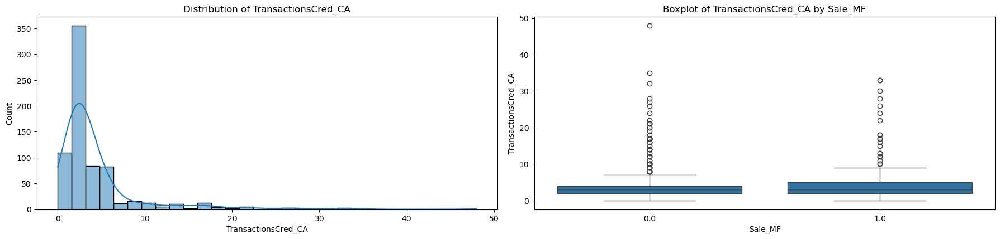

2025-01-01 12:25:10.072 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): VolumeDeb


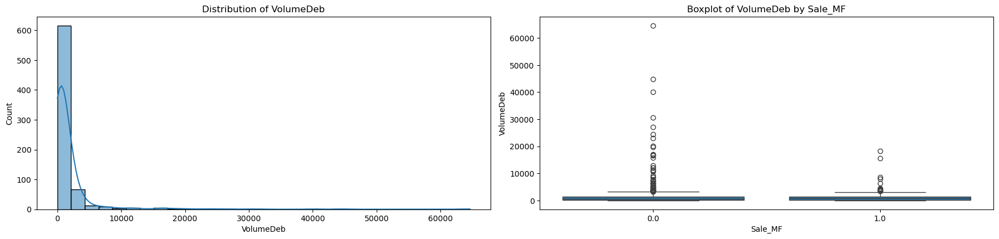

2025-01-01 12:25:10.199 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): VolumeDeb_CA


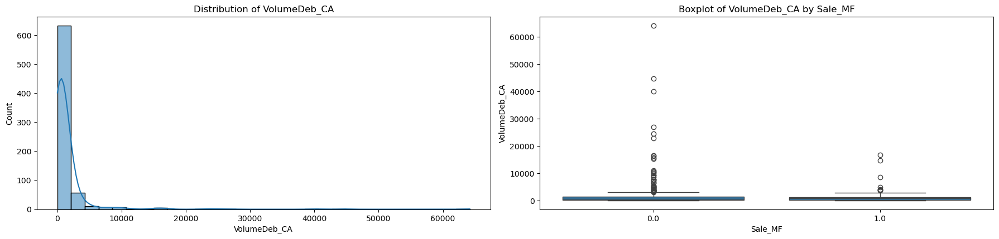

2025-01-01 12:25:10.321 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): VolumeDebCash_Card


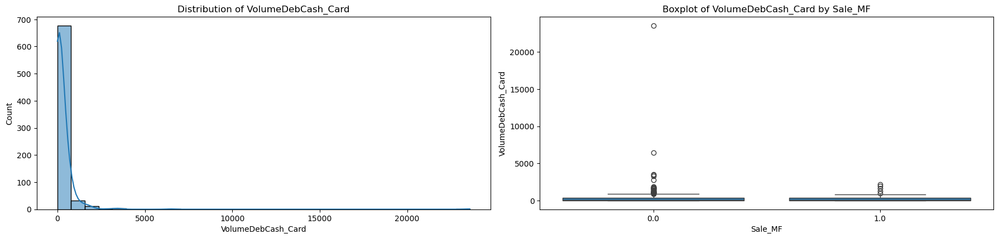

2025-01-01 12:25:10.437 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): VolumeDebCashless_Card


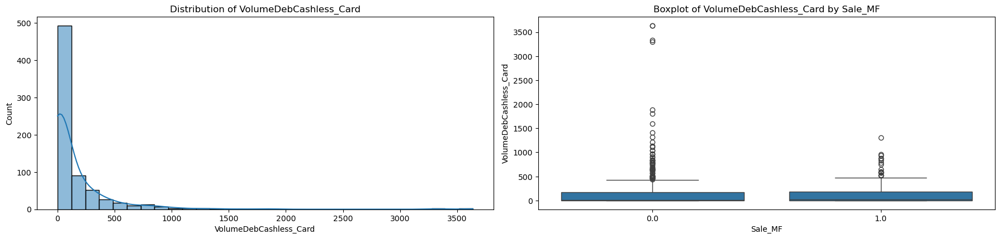

2025-01-01 12:25:10.561 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): VolumeDeb_PaymentOrder


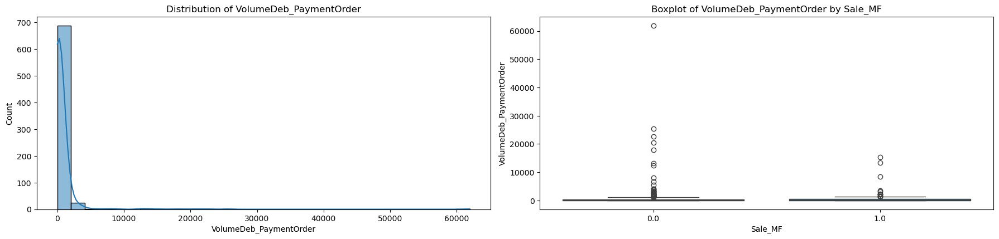

2025-01-01 12:25:10.793 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): TransactionsDeb


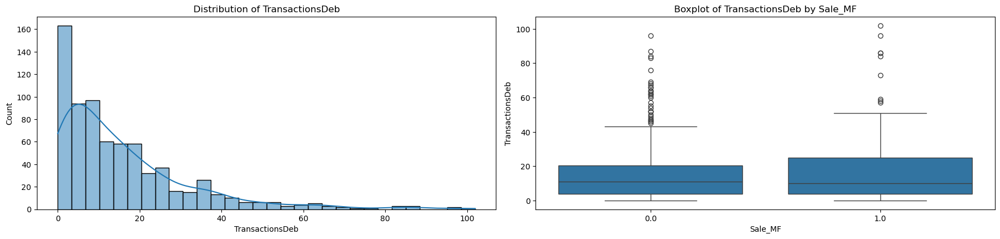

2025-01-01 12:25:10.914 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): TransactionsDeb_CA


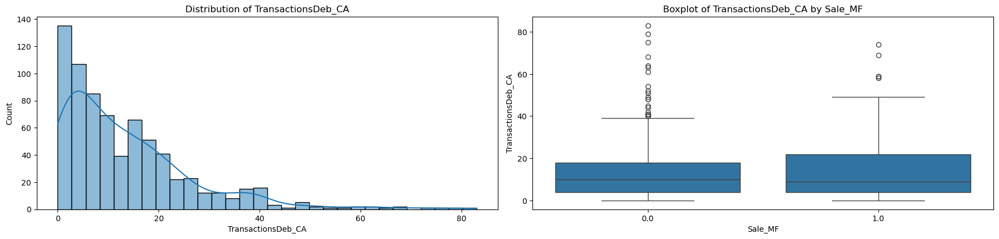

2025-01-01 12:25:11.071 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): TransactionsDebCash_Card


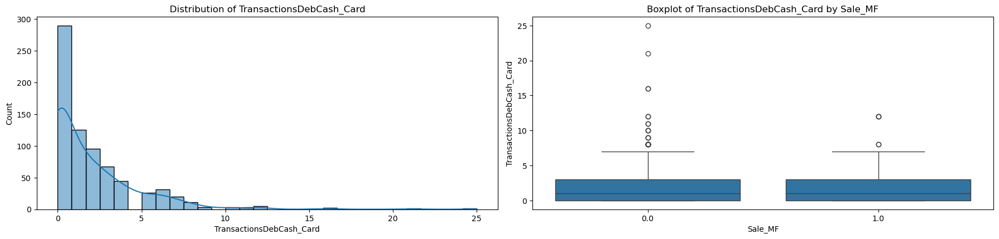

2025-01-01 12:25:11.188 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): TransactionsDebCashless_Card


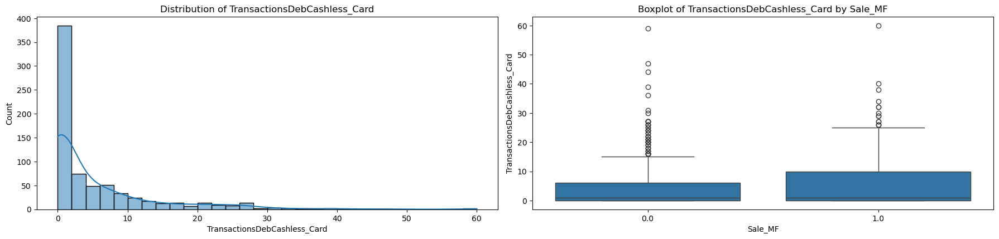

2025-01-01 12:25:11.356 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): TransactionsDeb_PaymentOrder


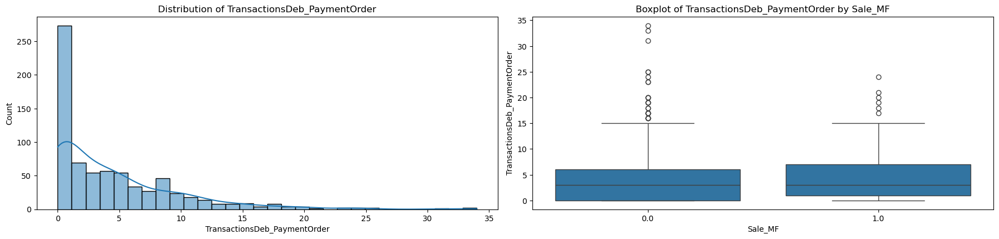

2025-01-01 12:25:11.478 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_Total_Asset


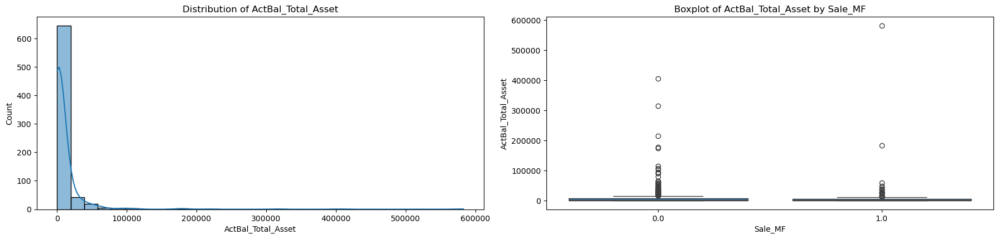

2025-01-01 12:25:11.639 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_Total_Liability


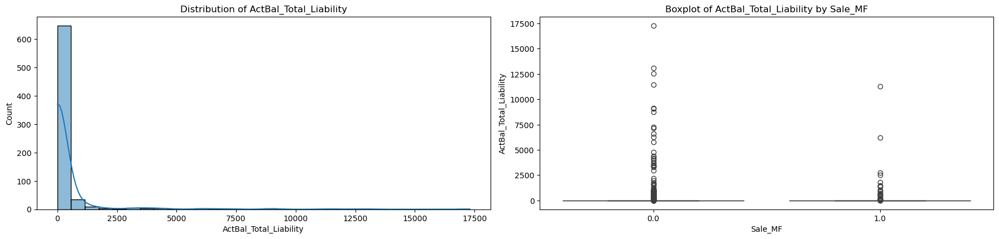

2025-01-01 12:25:11.824 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): ActBal_Total


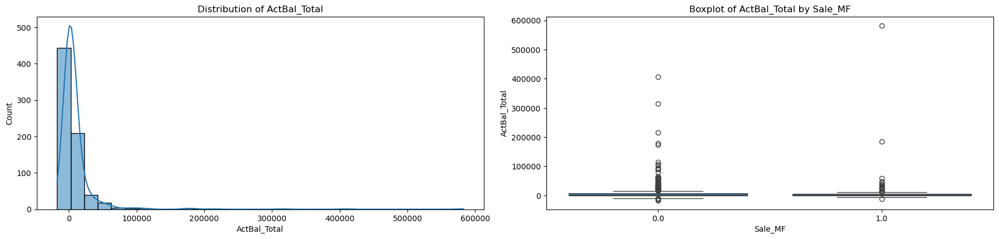

2025-01-01 12:25:11.983 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): Debt_To_Balance


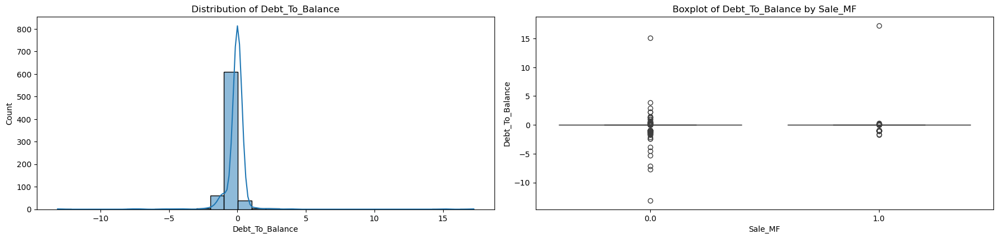

2025-01-01 12:25:12.106 | INFO     | src.eda:eda_sales_features:243 - EDA for Continuous Feature (Sale): Inflow_Outflow_Ratio


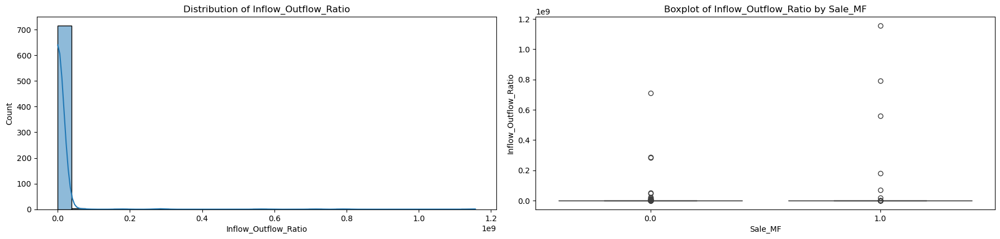

2025-01-01 12:25:12.269 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Sex


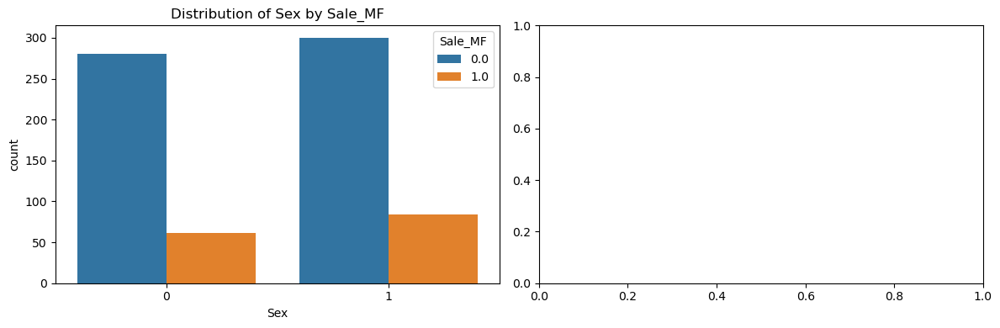

2025-01-01 12:25:12.348 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_CA


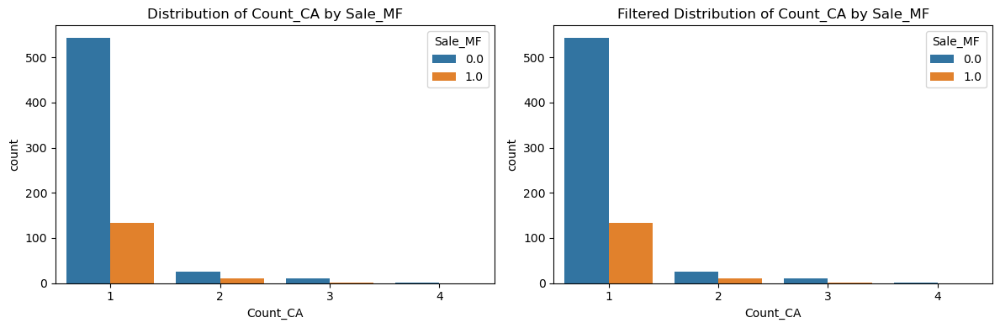

2025-01-01 12:25:12.487 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_SA


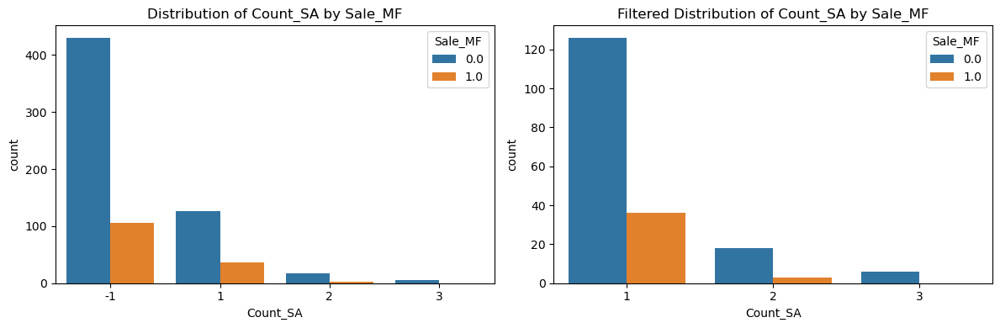

2025-01-01 12:25:12.589 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_MF


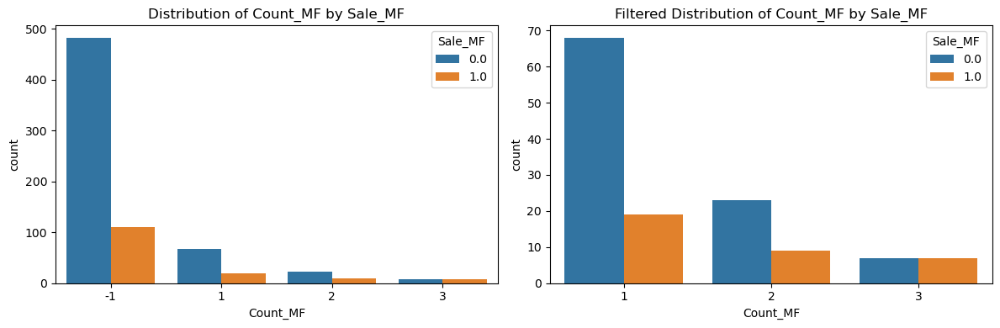

2025-01-01 12:25:12.735 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_OVD


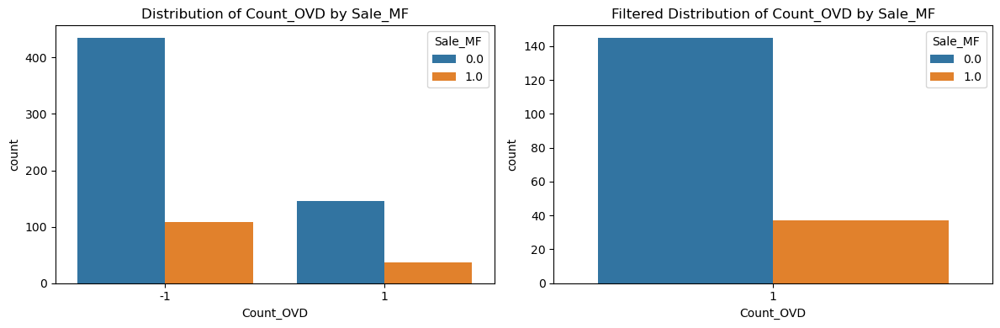

2025-01-01 12:25:12.831 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_CC


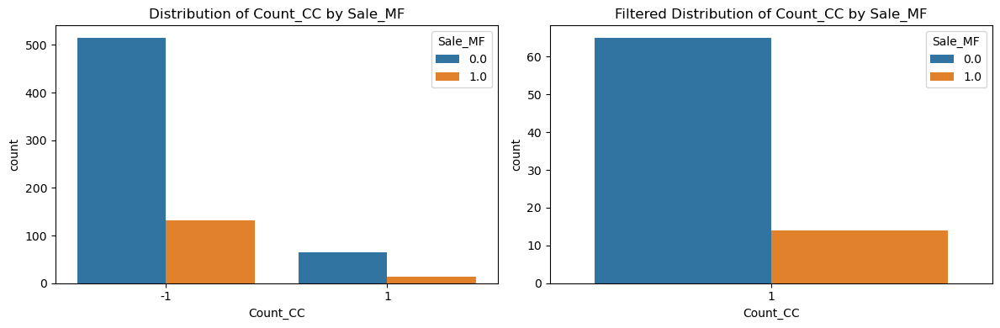

2025-01-01 12:25:12.923 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_CL


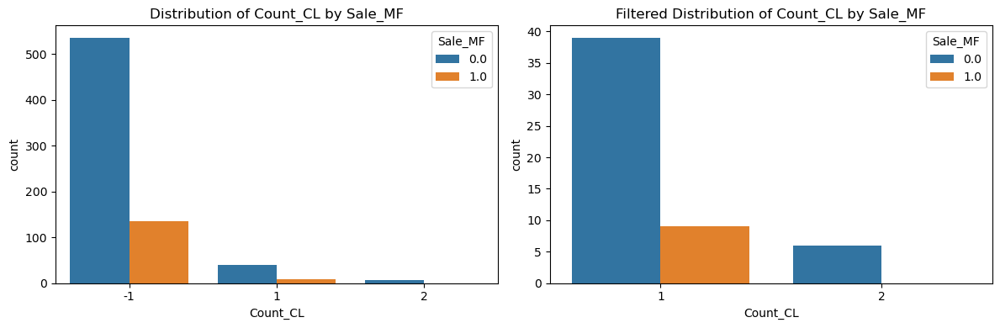

2025-01-01 12:25:13.130 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_Total_Asset


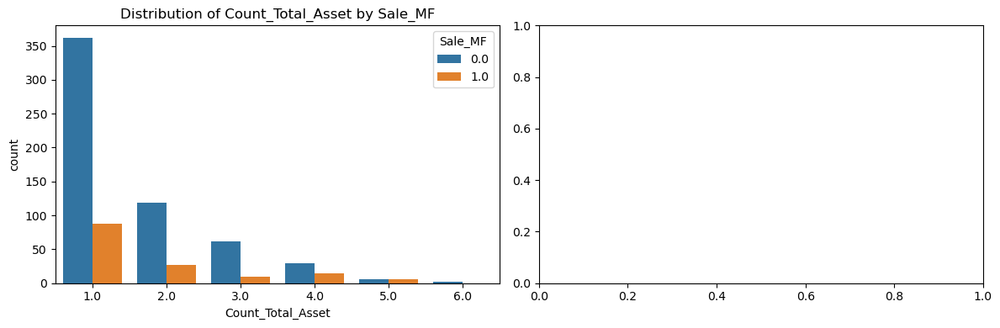

2025-01-01 12:25:13.222 | INFO     | src.eda:eda_sales_features:264 - EDA for Categorical Feature (Sale): Count_Total_Liability


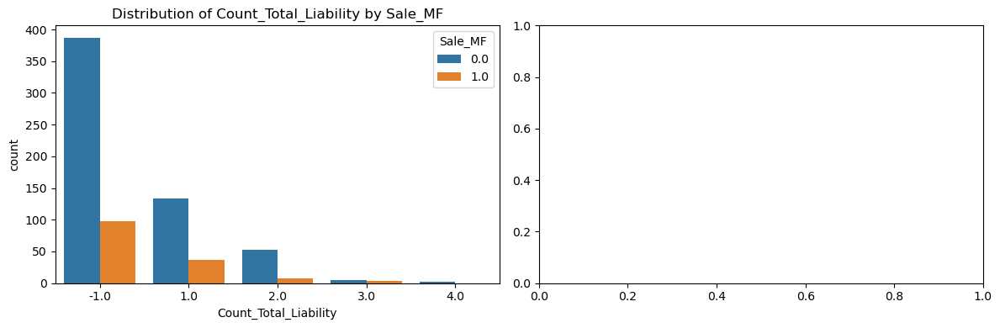

2025-01-01 12:25:13.356 | INFO     | src.eda:eda_sales_features:277 - Analyzing correlations for sales features


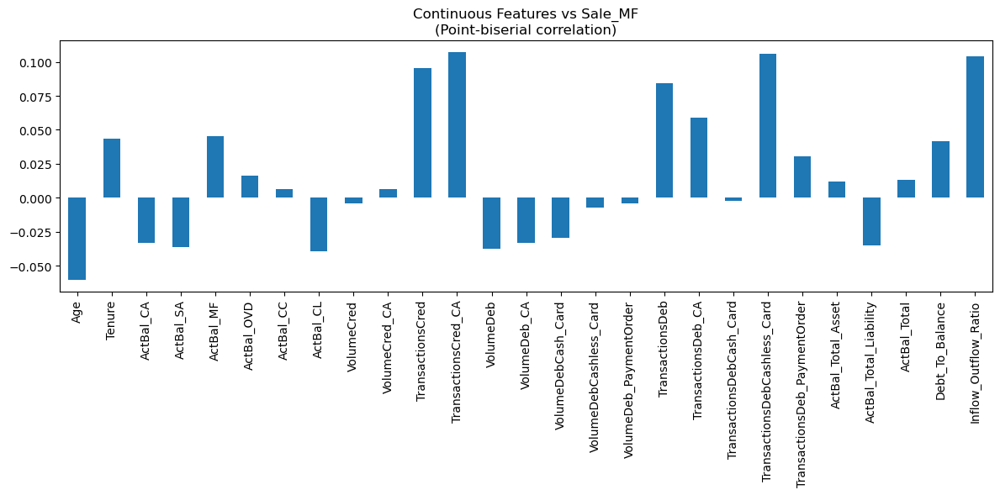

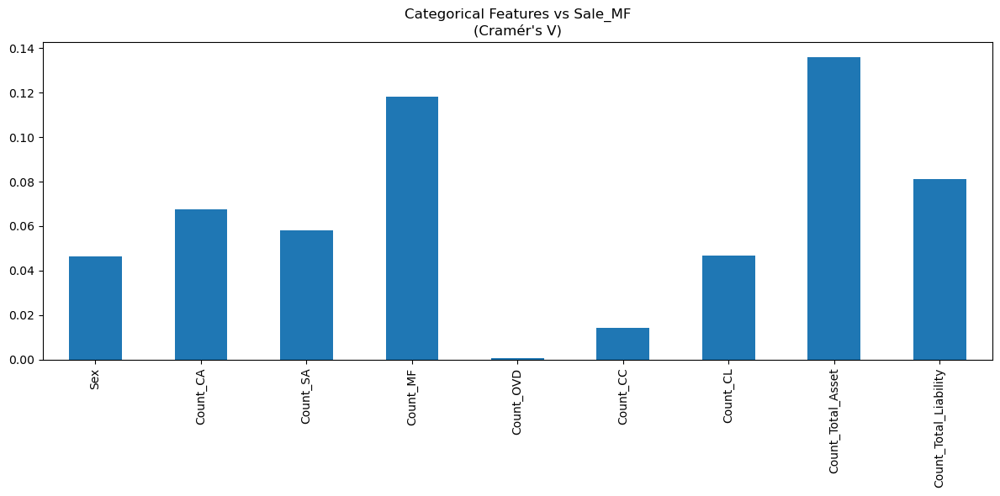

2025-01-01 12:25:13.588 | INFO     | src.eda:eda:45 - Performing EDA for Revenue
2025-01-01 12:25:13.589 | INFO     | src.eda:eda_revenue:225 - EDA for Revenue Target
2025-01-01 12:25:13.590 | INFO     | src.eda:print_table:70 - 
+-------+------------------+-------------------+----------------------+-------------------+--------------------+-------------------+-------------------+
| count |       mean       |        std        |         min          |        25%        |        50%         |        75%        |        max        |
+-------+------------------+-------------------+----------------------+-------------------+--------------------+-------------------+-------------------+
| 145.0 | 9.97745566502463 | 22.06056184355354 | 0.004821428571428572 | 1.269642857142857 | 3.3466071428571427 | 9.290178571428571 | 220.4882142857143 |
+-------+------------------+-------------------+----------------------+-------------------+--------------------+-------------------+-------------------+


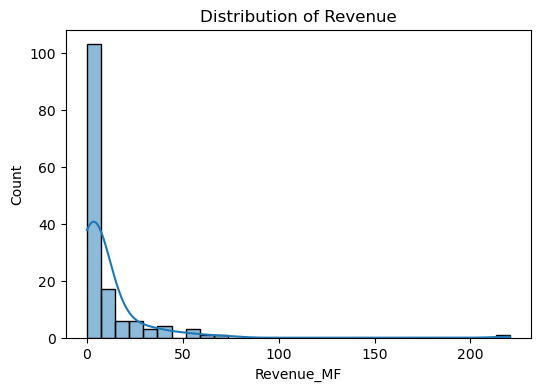

2025-01-01 12:25:13.640 | INFO     | src.eda:eda:47 - Performing EDA for Revenue-related Features
2025-01-01 12:25:13.641 | INFO     | src.eda:eda_revenue_features:288 - Analyzing correlations for revenue features


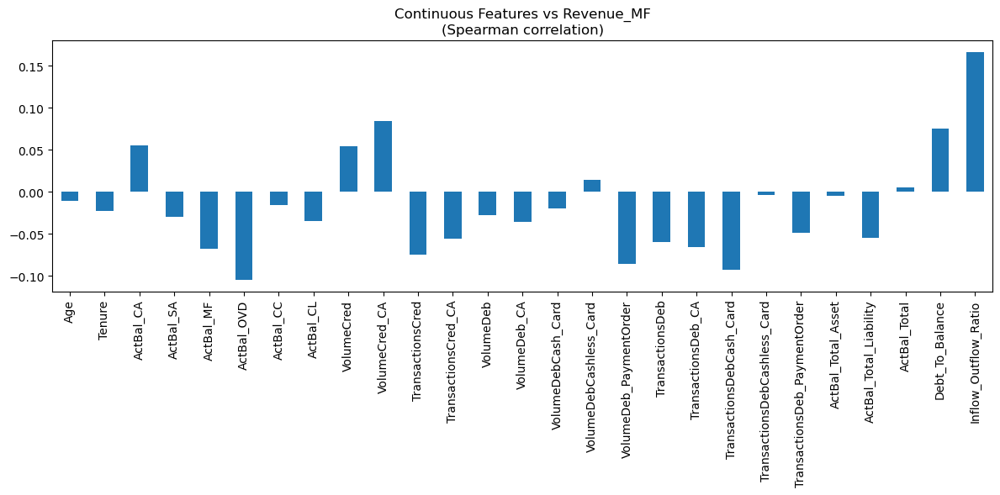

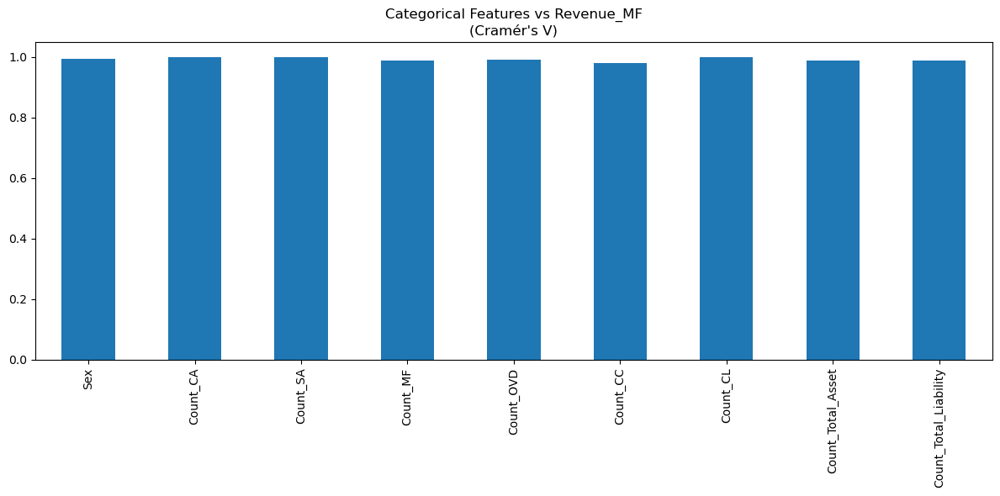

2025-01-01 12:25:13.875 | INFO     | src.eda:eda:51 - Performing Continuous Features Correlation Analysis


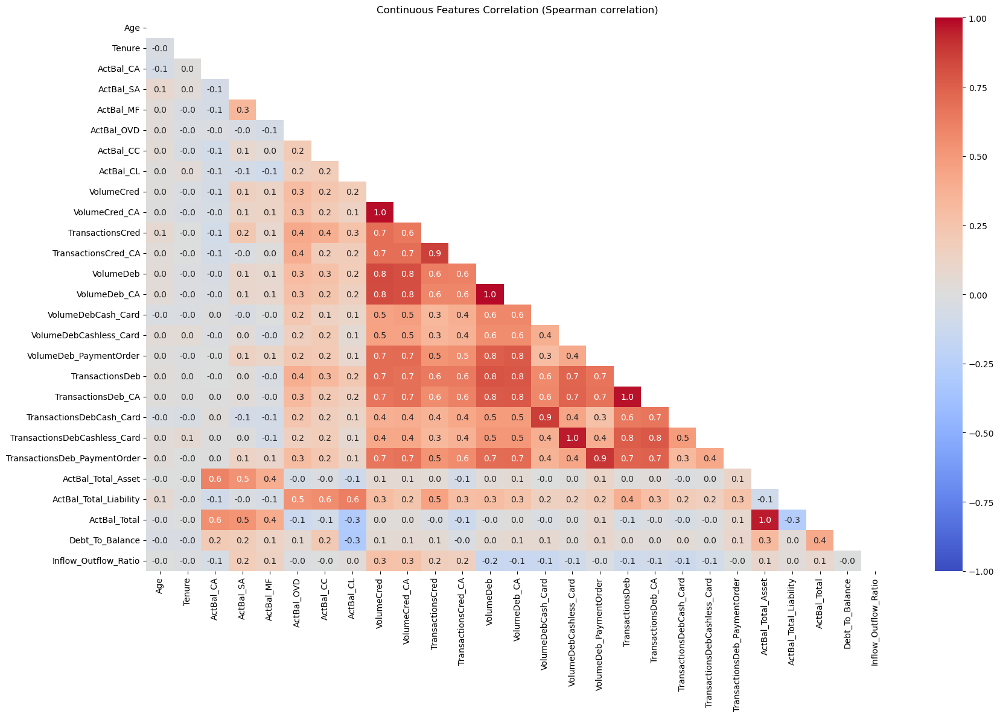

2025-01-01 12:25:14.239 | INFO     | src.eda:eda:53 - Performing Categorical vs Categorical Correlation Analysis


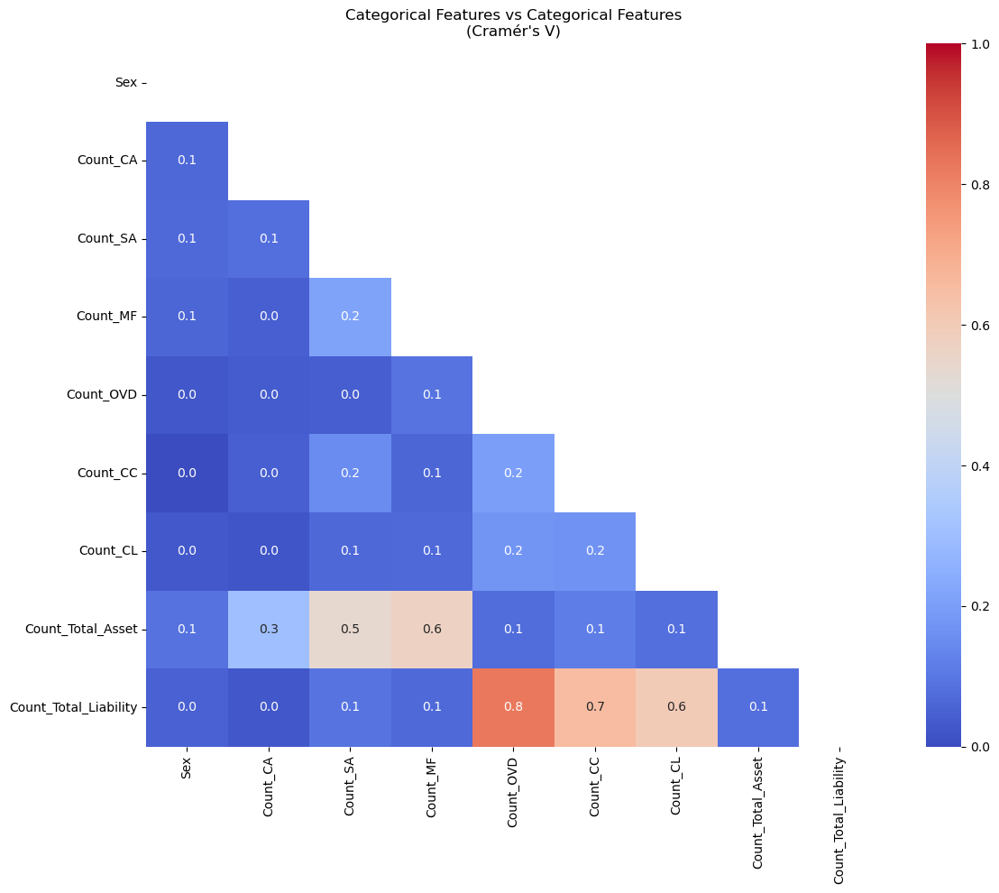

2025-01-01 12:25:14.461 | INFO     | src.eda:eda:55 - Performing Categorical vs Continuous Correlation Analysis


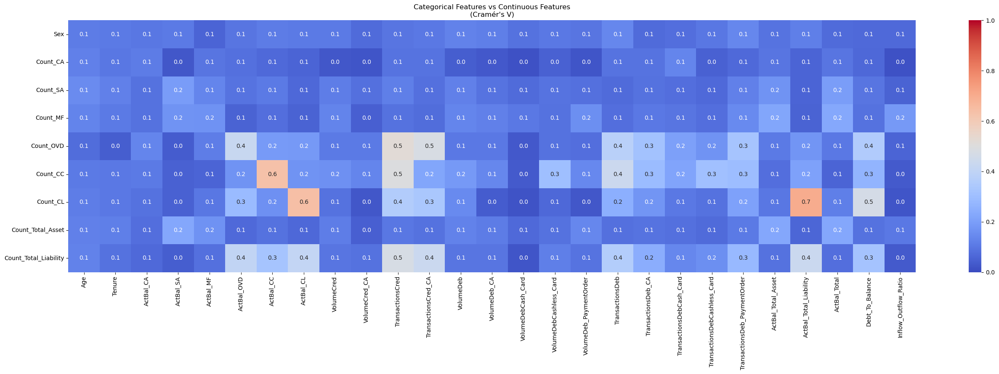

In [14]:
# For loop to plot the graphs for the 6 datasets we will generate, 1 for each model
for suffix, data in dfs.items():
    data, _ = train_test_split(
        data, train_size=0.8, stratify=data[f"Sale_{suffix}"], random_state=random_seed
    )
    eda(
        data,
        sale_col=f"Sale_{suffix}",
        revenue_col=f"Revenue_{suffix}",
        exclude_features=prod_bal_features,
    )

### EDA Analysis

Here, we will note down our findings, and also select the variables.

There are some assumptions about the dataset to be made. The analysis will be completely different depending on the  
cases:

1. Feature data is from **before** the product was bought. So we read this case as:
    - "This was the data at the point in time when the client bought the product."
    - Consider the case of `CC`, this assumption would be helpful for predicting if a future client would buy the  
        product, i.e., we can use `Count_CC` and `ActBal_CC` as features for prediction.
    - "Due to the client already having these habits, the result is that they have bought the product."

1. Feature data is from **after** the product was bought. So we read this case as:
    - "This data reflects the client’s behavior or financial status after purchasing the product."
    - In this case, features like `Count_CC` and `ActBal_CC` are affected by the product itself and cannot be reliably  
        used for prediction. 
    - These features would only explain post-purchase behavior rather than factors influencing the purchase decision.
    - This scenario introduces **data leakage** if such features are included in the predictive model, as they  
        inherently depend on the target variable.

Judging from the EDA results, it does not seem like there is any inherent dependency. We will therefore assume the  
first case.

We will also put in all the features we created into every dataset.

[Back to Top](#Direct-marketing-optimisation)

---
#### Credit Card
---

**For Sale**  
The minority class (positive) is about 25% of the total number of data points. We discuss how to handle the class  
imbalance later on.

1. Continuous features distribution seems to be right skewed, suggesting a large number of outliers
1. Box plots comparing 0 and 1 that show some semblance of being different (including filtered box plots):
    - `ActBal_SA`
    - `ActBal_OVD`
    - `ActBal_CC`
    - `ActBal_CL`
    - `VolumeDebCashless_Card`
1. Bar plots:
    - `Sex`: Females seem more likely to have bought CC
    - `Count_SA`: The proportion of 1 in class 1 seems to be higher than all other classes
1. Point-biserial correlation:
    - `ActBal_SA`: The highest value at ~0.2, the rest of the values are below 0.1
    - `ActBal_CA`: The 2nd highest at ~0.15
    - The last 5 are our created continuous features. They do not seem to perform under this metric.
1. Cramer's V:
    - `Count_SA`
    - The last 2 are our new features. They seem to have higher association (to `Sale_CC`) than all the other  
        features, however, this is most likely due to the effect of `Count_SA`

**Narrative on Consumer Behavior Insights**  
Our analysis provides key insights into the factors influencing consumer behavior around owning credit cards:
1. **Savings as a Positive Indicator:**  
    Clients with higher savings are more likely to own credit cards. This could be tied to their overall financial  
    stability, possibly driven by higher income levels. Such clients may view credit cards as a complementary tool to  
    manage their financial activities or enhance their purchasing power.
1. **Debt as a Negative Factor:**  
    Variables like `ActBal_OVD`, `ActBal_CC`, and `ActBal_CL`, which indicate outstanding debts or liabilities, show a  
    negative association with credit card ownership. This aligns with intuition—clients already burdened with debt are  
    less likely to take on additional financial obligations.
1. **Spending Activity Boosts Propensity:**  
    Higher volumes of debit transactions are associated with an increased likelihood of owning credit cards. This is  
    intuitive, as clients with higher transactional activity may seek credit cards to streamline or reward their  
    spending habits.
1. **Surprising Neutrality of Debt-to-Income Ratio:**  
    Despite being a key financial metric, `Inflow_Outflow_Ratio` appears to have no significant impact on credit card  
    ownership. This could indicate that clients’ debt and income levels are already factored into other variables, or it  
    may reflect that credit card decisions are influenced by more granular behavioral patterns rather than aggregate  
    ratios.

**Conclusion:**  
These insights provide a nuanced understanding of consumer behavior, highlighting the balance between financial  
stability and transactional habits as drivers of credit card ownership, while cautioning against over-reliance on  
aggregate metrics like `Inflow_Outflow_Ratio`. This framework can guide targeted strategies for identifying and engaging  
potential credit card customers.

---

**For Revenue**  
Revenue is extremely right skewed, with a few outliers with very high revenue. We will not drop these outliers as they  
could represent the "top earners."

1. Spearman correlation:
    - `VolumeDebCashless_Card` and `TransactionsDebCashless_Card` stand out the most with positive correlations.
    - `ActBal_CA` and `ActBal_SA` are negatively correlated, contrary to their impact on `Sale_CC`.
    - `Inflow_Outflow_Ratio` seems to still be insignificant.
    - `Age` shows a negative correlation.
1. Cramer's V:
    - Every single feature shows a high association with `Revenue_CC`, possibly due to the inherent structure of the  
        dataset.

**Narrative on Consumer Behavior Insights**  
Our analysis provides key insights into the factors influencing consumer behavior around credit card spending (or  
revenue in the bank's case):
1. **Cashless Card Transactions as a Positive Indicator:**  
    This is intuitive. The more transactions that occur, especially cashless ones, the more the bank earns. These  
    transactions contribute significantly to credit card revenue through fees and interest.
1. **Savings as a Negative Factor:**  
    It seems that clients who have more balance in their asset accounts are less likely to generate revenue for credit  
    cards. This could be because they do not need to rely as much on credit cards for spending or financing.
1. **Age:**  
    Older clients tend to have a larger amount of assets, which ties in with the point above. This may explain  
    the negative correlation between age and credit card revenue.
1. **Sex:**  
    Females, as seen in the sale analysis, seem to generate more revenue through credit cards. This may suggest  
    differences in spending patterns or credit card usage behaviors across genders.

**Conclusion:**  
The primary drivers of credit card revenue are transaction activity, particularly cashless transactions, and spending  
behavior. Conversely, clients with higher asset balances or older clients appear less dependent on credit cards,  
contributing less to revenue. These insights can guide strategies to target high-activity clients and optimise revenue  
generation.

---

**Feature selection**
We select those with relatively higher correlation, before cross checking with the feature correlation.
- Sale:  
    ["Age", "VolumeDeb_PaymentOrder", "TransactionsDebCashless_Card", "ActBal_Total_Asset", "ActBal_Total_Liability", "ActBal_Total", "Debt_To_Balance", "Inflow_Outflow_Ratio", "Count_Total_Asset", "Count_Total_Liability"]
- Revenue:  
    ["Age", "Tenure", "VolumeDebCashless_Card", "TransactionsDebCashless_Card", "TransactionsDeb", "TransactionsDeb_CA", "ActBal_Total_Asset", "ActBal_Total_Liability", "ActBal_Total", "Debt_To_Balance", "Inflow_Outflow_Ratio", "Count_Total_Asset", "Count_Total_Liability"]

[Back to Top](#Direct-marketing-optimisation)

---
#### Consumer Loan
---

**For Sale**  
The minority class (positive) is about 28% of the total number of data points.

1. Continuous features distribution seems to be right skewed, suggesting a large number of outliers.
1. Box plots comparing 0 and 1 that show some semblance of being different (including filtered box plots):
    - `Age`
    - `Sex`
    - `ActBal_OVD`
    - `ActBal_CC`
    - `ActBal_CL`
1. Bar plots:
    - `Sex`: Females seem more likely to have bought CL.
    - `Count_SA`: The proportion of 1 in class 2 is higher than all other classes.
    - `Count_CL`: The proportion of 1 in class 2 is higher than all other classes.
1. Point-biserial correlation:
    - `Age`
    - `Tenure`
    - `ActBal_OVD`
    - `ActBal_CC`: Also a loan product.
    - `TransactionsDeb`, `TransactionsCred`
    - The last 5 are our created continuous features. `ActBal_Total_Liability`, `Debt_To_Balance` seem to have some  
        effect, relatively.
1. Cramer's V:
    - `Count_SA`, `Count_CA`
    - The last 2 are our new features. They seem to have higher relative association.

**Narrative on Consumer Behavior Insights**  
Our analysis provides key insights into the factors influencing consumer behavior around owning consumer loans:  

1. **Younger clients require more loans:**  
    Younger individuals, especially those just entering adulthood, are more likely to require consumer loans to support  
    their lifestyle or cover financial gaps. This is particularly common in Western countries, where loans are often  
    utilised for education, housing, or other essential needs.

1. **Increasing overdraft balance increases the likelihood of getting a consumer loan:**  
    A higher overdraft balance may push clients toward consumer loans, as overdrafts typically carry higher interest  
    rates. Taking a consumer loan may offer better financial terms and help clients consolidate their debt.

1. **Higher income could lead to higher consumer loan amounts:**  
    Higher-income clients may take out consumer loans for various reasons, including better access to favorable interest  
    rates (due to their creditworthiness), leveraging loans for investments, or financing large purchases.

1. **Debt to balance ratio is a nuanced factor:**  
    This metric provides an interesting dichotomy in interpretation:
        - **Negative values:** A smaller (more negative) ratio implies higher debt compared to income, which might  
        correlate with a greater likelihood of needing a consumer loan to manage finances.
        - **Positive values:** Larger ratios indicate higher income compared to debt, which might reduce the need for a  
        loan but could also lead to strategic borrowing for investments or other purposes.

**Conclusion:**  
The analysis highlights key drivers of consumer loan ownership, including age, overdraft balance, and income levels.  
Younger clients and those with higher overdraft balances are more likely to need loans, while higher-income clients  
might utilise loans strategically. The nuanced relationship between debt-to-balance ratios adds complexity, indicating  
a need for tailored strategies to address clients across different financial profiles. These findings can guide targeted  
loan offerings and better risk management.

---

**For Revenue**  
Revenue is right skewed, with a few outliers with very high revenue. We will not drop these outliers as they  
could represent the "top earners."

1. Spearman correlation:
    - `Age`: Positive correlation, suggesting older clients generate more revenue from consumer loans.
    - `ActBal_CA`: Positive correlation, likely indicating that high net-worth individuals with larger current account  
        balances tend to generate more loan revenue.
    - `ActBal_CC`: Negative correlation, which may suggest that clients with higher credit card balances rely less on  
        consumer loans, potentially using credit cards as their primary financing method.
    - `TransactionsCred`: Negative correlation, which might indicate that higher credit transactions reduce reliance on  
        consumer loans, thereby reducing revenue.

1. Cramer's V:
    - Every single feature shows a high association with `Revenue_CL`, possibly due to the inherent structure of the  
        dataset.

**Narrative on Consumer Behavior Insights**  
Our analysis provides key insights into the factors influencing consumer behavior around consumer loan revenue:

1.  **Older clients contribute more to loan revenue:**  
    The positive correlation between `Age` and `Revenue_CL` suggests that older clients are more likely to generate  
    higher loan revenues. This could be due to larger loan amounts, better credit terms, or extended loan usage.

1.  **Current account balances are a strong indicator of loan revenue:**  
    Clients with higher `ActBal_CA` tend to generate more revenue, potentially because they have access to larger loans  
    or manage their loans strategically, increasing interest payments.

1.  **Credit card balances have a negative impact on loan revenue:**  
    The negative correlation with `ActBal_CC` suggests that clients with higher credit card balances might already be  
    leveraging credit cards for financing, reducing their reliance on consumer loans.

1.  **Credit transactions reduce loan reliance:**  
    The negative correlation with `TransactionsCred` suggests that clients who frequently use credit-based transactions  
    may rely less on consumer loans, reducing their contribution to revenue.

**Conclusion:**  
The primary drivers of consumer loan revenue include age, current account balances, and the interplay between different  
financial products. Older clients and those with higher financial engagement generate more revenue, while frequent  
credit transactions and higher credit card balances appear to reduce dependency on consumer loans. These insights can  
guide strategies for maximizing revenue through tailored loan offerings and targeted marketing to high-value clients.

---

**Feature selection**
We select those with relatively higher correlation, before cross checking with the feature correlation.
- Sale:  
    ["Age", "Tenure", "ActBal_OVD", "TransactionsCred", "ActBal_Total_Asset", "ActBal_Total_Liability", "ActBal_Total", "Debt_To_Balance", "Inflow_Outflow_Ratio", "Count_Total_Asset", "Count_Total_Liability"]
- Revenue:  
    ["Age", "ActBal_CA", "ActBal_CC", "TransactionsCred", "TransactionsDeb", "TransactionsDeb_paymentOrder", "ActBal_Total_Asset", "ActBal_Total_Liability", "ActBal_Total", "Debt_To_Balance", "Inflow_Outflow_Ratio", "Count_Total_Asset", "Count_Total_Liability"]

[Back to Top](#Direct-marketing-optimisation)

---
#### Mutual Fund
---
**For Sale**  
The minority class (positive) is about 20% of the total number of data points.

1. Continuous features distribution seems to be right skewed, suggesting a large number of outliers.
1. Box plots comparing 0 and 1 that show some semblance of being different (including filtered box plots):
    - Seems to have no big variations between classes.
1. Bar plots:
    - `Count_SA`: Clients with 3 SA accounts seem less likely to buy mutual funds.
    - `Count_MF`: The proportion of clients buying mutual funds appears to increase with the number of MF accounts.
    - `Count_CL`: Clients with 2 CL accounts do not have any MF accounts.
1. Point-biserial correlation:  
    The absolute values are all < 0.1, but the relatively higher values include:  
    - `Age`: -0.06, suggesting younger clients are more likely to buy mutual funds.
    - `TransactionsCred`, `TransactionsCred_CA`: 0.1, indicating that higher credit transactions correlate with mutual  
        fund purchases.
    - `TransactionsDeb`: 0.075, showing a weaker but positive relationship with debit transactions.
    - `ActBal_CC`: 0.05, as a related financial product.
    - `TransactionsDebCash_Card`: ~0.07, suggesting more cashless transactions correlate slightly with mutual fund  
        purchases.
    - The last 5 are our created continuous features. `Inflow_Outflow_Ratio` has a weak correlation of 0.1.
1. Cramer's V:
    - `Count_MF` and `Count_Total_Asset` > 0.1, indicating some association with mutual fund ownership.
    - The last 2 are our new features, which show relatively higher association.

**Narrative on Consumer Behavior Insights**  
Our analysis provides key insights into the factors influencing consumer behavior around owning mutual funds:  

1.  **Clients with existing mutual fund accounts are more likely to invest further:**  
    The positive association with `Count_MF` suggests that clients who already own mutual funds are more likely to buy  
    additional ones, reflecting a possible habit or preference for this financial product.
1.  **Wealthier clients tend to own mutual funds:**  
    The association with `Count_Total_Asset` and `Inflow_Outflow_Ratio` implies that clients with higher financial stability  
    and assets are more likely to invest in mutual funds.
1.  **Older clients might be less likely to invest in mutual funds:**  
    The negative correlation with `Age` suggests that as clients get older, they are less inclined toward buying mutual  
    funds. This could be due to a shift in financial priorities toward more conservative investments or  
    retirement-related financial products.
1.  **Higher credit activity correlates with mutual fund ownership:**  
    Positive correlations with `TransactionsCred` and `TransactionsCred_CA` indicate that clients who actively use  
    credit services may also be more likely to buy mutual funds, potentially reflecting higher financial literacy or  
    investment activity.

**Conclusion:**  
The analysis highlights key drivers of mutual fund ownership, including existing mutual fund accounts, wealth indicators  
like `Inflow_Outflow_Ratio`, and transactional activity. Older clients appear less likely to own mutual funds, while higher  
credit activity and financial stability are positive predictors. These findings can help tailor marketing strategies and  
investment offerings to different client segments.

---

**For Revenue**  
Revenue is very right skewed, with a few outliers generating very high revenue. These outliers will not be dropped as  
they could represent the "top earners."  
1. **Spearman correlation:**  
    The absolute values are slightly stronger than those observed for ownership, with the following notable ones:  
    - `ActBal_OVD`, `VolumeDeb_PaymentOrder`, `TransactionsDebCash_Card`: -0.1, indicating a weak negative relationship  
        between overdrafts, payment orders, debit transactions, and revenue.
    - `VolumeCred_CA`, `Debt_To_Balance`: ~0.1, suggesting a weak positive relationship between these variables and  
        revenue.
    - `Inflow_Outflow_Ratio`: 0.16, the strongest positive correlation, suggesting that clients with higher disposable  
        income contribute more to mutual fund revenue.

1. **Cramer's V:**  
    - Every single feature shows a high association with `Revenue_MF`, likely due to the inherent structure of the  
        dataset or underlying shared financial behaviors.  

**Narrative on Consumer Behavior Insights**  
Our analysis provides key insights into the factors influencing mutual fund revenue:  
1.  **Inflow-Outflow Ratio as a Key Driver of Revenue:**  
    The strongest positive correlation with `Inflow_Outflow_Ratio` suggests that clients with higher disposable income  
    contribute more revenue. This is likely because such clients have more financial capacity to invest in mutual funds  
    and generate associated fees or returns.  
1.  **Wealth Indicators and Mutual Fund Revenue:**  
    Positive correlations with `VolumeCred_CA` and `Debt_To_Balance` suggest that clients with higher financial  
    activity, credit engagement, and asset balances are significant contributors to mutual fund revenue.
1.  **Negative Impact of Certain Financial Activities:**  
    Weak negative correlations with `ActBal_OVD`, `VolumeDeb_PaymentOrder`, and `TransactionsDebCash_Card` suggest that  
    clients heavily engaged in debit transactions or with higher overdrafts are less likely to contribute significantly  
    to mutual fund revenue. These behaviors may indicate a focus on liquidity or short-term financial needs, diverting  
    funds away from long-term investments.

---

**Conclusion:**  
The primary drivers of mutual fund revenue include the inflow-outflow ratio, credit activity, and indicators of client  
wealth. Clients with higher disposable income (as indicated by `Inflow_Outflow_Ratio`), higher financial engagement, and  
larger credit activity contribute more revenue. Conversely, clients with higher debit activity and overdrafts prioritise  
liquidity, leading to lower revenue contributions. These insights can guide targeted strategies to optimise mutual fund  
offerings and engagement with high-revenue clients.

---

**Feature selection**
We select those with relatively higher correlation, before cross checking with the feature correlation.
- Sale:  
    ["Age", "Count_MF", "TransactionsCred", "TransactionsCred_CA", "ActBal_Total_Asset", "ActBal_Total_Liability", "ActBal_Total", "Debt_To_Balance", "Inflow_Outflow_Ratio", "Count_Total_Asset", "Count_Total_Liability"]
- Revenue:  
    ["Age", "VolumeCred_CA", "ActBal_OVD", "VolumeDeb_PaymentOrder", "TransactionsDebCash_Card", "TransactionsDeb_paymentOrder", "ActBal_Total_Asset", "ActBal_Total_Liability", "ActBal_Total", "Debt_To_Balance", "Inflow_Outflow_Ratio", "Count_Total_Asset", "Count_Total_Liability"]

[Back to Top](#Direct-marketing-optimisation)

### Generating the datasets
We now proceed to generate and save the datasets that we require for model training.

[Back to Top](#Direct-marketing-optimisation)

In [15]:
for suffix in suffixes:
    sale_features = eval(f"sale_{suffix.lower()}_features")
    revenue_features = eval(f"revenue_{suffix.lower()}_features")
    target = [[f"Sale_{suffix}"], [f"Revenue_{suffix}"]]
    data_sale = df[sale_features + target[0]]
    data_revenue = df[revenue_features + target[1]]
    path_sale = preprocessed_data_directory + f"sale_{suffix.lower()}.csv"
    path_revenue = preprocessed_data_directory + f"revenue_{suffix.lower()}.csv"
    data_sale.to_csv(path_sale, index=False)
    data_revenue.to_csv(path_revenue, index=False)

logger.info("Data saved")

2025-01-01 12:25:15.413 | INFO     | __main__:<module>:12 - Data saved


We have reached the end of this notebook. Please proceed to the model training notebook.